## US AIRLINE DATASET ANALYSIS

### Importing the necessary libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pt
import warnings
warnings.filterwarnings("ignore")

### Data Cleaning

In [2]:
airline = pd.read_csv("Airlinedata.csv")
airline

,tbl,Year,quarter,citymarketid_1,citymarketid_2,city1,city2,airportid_1,airportid_2,airport_1,...,fare,carrier_lg,large_ms,fare_lg,carrier_low,lf_ms,fare_low,Geocoded_City1,Geocoded_City2,tbl1apk
0,Table1a,2021,3,30135,33195,"Allentown/Bethlehem/Easton, PA","Tampa, FL (Metropolitan Area)",10135,14112,ABE,...,81.43,G4,1.0000,81.43,G4,1.0000,81.43,NaN,NaN,202131013514112ABEPIE
1,Table1a,2021,3,30135,33195,"Allentown/Bethlehem/Easton, PA","Tampa, FL (Metropolitan Area)",10135,15304,ABE,...,208.93,DL,0.4659,219.98,UA,0.1193,154.11,NaN,NaN,202131013515304ABETPA
2,Table1a,2021,3,30140,30194,"Albuquerque, NM","Dallas/Fort Worth, TX",10140,11259,ABQ,...,184.56,WN,0.9968,184.44,WN,0.9968,184.44,NaN,NaN,202131014011259ABQDAL
3,Table1a,2021,3,30140,30194,"Albuquerque, NM","Dallas/Fort Worth, TX",10140,11298,ABQ,...,182.64,AA,0.9774,183.09,AA,0.9774,183.09,NaN,NaN,202131014011298ABQDFW
4,Table1a,2021,3,30140,30466,"Albuquerque, NM","Phoenix, AZ",10140,14107,ABQ,...,177.11,WN,0.6061,184.49,AA,0.3939,165.77,NaN,NaN,202131014014107ABQPHX
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245950,Table1a,2024,1,35412,31703,"Knoxville, TN","New York City, NY (Metropolitan Area)",15412,12953,TYS,...,278.70,DL,0.7503,287.44,AA,0.2359,248.46,NaN,NaN,202411541212953TYSLGA
245951,Table1a,2024,1,35412,32467,"Knoxville, TN","Miami, FL (Metropolitan Area)",15412,11697,TYS,...,148.69,G4,0.8255,114.45,G4,0.8255,114.45,NaN,NaN,202411541211697TYSFLL
245952,Table1a,2024,1,35412,32467,"Knoxville, TN","Miami, FL (Metropolitan Area)",15412,13303,TYS,...,330.19,AA,0.8057,321.92,AA,0.8057,321.92,NaN,NaN,202411541213303TYSMIA
245953,Table1a,2024,1,35412,33195,"Knoxville, TN","Tampa, FL (Metropolitan Area)",15412,14112,TYS,...,95.65,G4,1.0000,95.65,G4,1.0000,95.65,NaN,NaN,202411541214112TYSPIE


In [3]:
airline.shape

(245955, 23)

In [4]:
airline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245955 entries, 0 to 245954
Data columns (total 23 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   tbl             245955 non-null  object 
 1   Year            245955 non-null  int64  
 2   quarter         245955 non-null  int64  
 3   citymarketid_1  245955 non-null  int64  
 4   citymarketid_2  245955 non-null  int64  
 5   city1           245955 non-null  object 
 6   city2           245955 non-null  object 
 7   airportid_1     245955 non-null  int64  
 8   airportid_2     245955 non-null  int64  
 9   airport_1       245955 non-null  object 
 10  airport_2       245955 non-null  object 
 11  nsmiles         245955 non-null  int64  
 12  passengers      245955 non-null  int64  
 13  fare            245955 non-null  float64
 14  carrier_lg      244415 non-null  object 
 15  large_ms        244415 non-null  float64
 16  fare_lg         244415 non-null  float64
 17  carrier_lo

In [5]:
airline.isnull().sum()


tbl                   0
Year                  0
quarter               0
citymarketid_1        0
citymarketid_2        0
city1                 0
city2                 0
airportid_1           0
airportid_2           0
airport_1             0
airport_2             0
nsmiles               0
passengers            0
fare                  0
carrier_lg         1540
large_ms           1540
fare_lg            1540
carrier_low        1612
lf_ms              1612
fare_low           1612
Geocoded_City1    39206
Geocoded_City2    39206
tbl1apk               0
dtype: int64

In [6]:
airline = airline.drop(["Geocoded_City1","Geocoded_City2","tbl"],axis=1)
airline

,Year,quarter,citymarketid_1,citymarketid_2,city1,city2,airportid_1,airportid_2,airport_1,airport_2,nsmiles,passengers,fare,carrier_lg,large_ms,fare_lg,carrier_low,lf_ms,fare_low,tbl1apk
0,2021,3,30135,33195,"Allentown/Bethlehem/Easton, PA","Tampa, FL (Metropolitan Area)",10135,14112,ABE,PIE,970,180,81.43,G4,1.0000,81.43,G4,1.0000,81.43,202131013514112ABEPIE
1,2021,3,30135,33195,"Allentown/Bethlehem/Easton, PA","Tampa, FL (Metropolitan Area)",10135,15304,ABE,TPA,970,19,208.93,DL,0.4659,219.98,UA,0.1193,154.11,202131013515304ABETPA
2,2021,3,30140,30194,"Albuquerque, NM","Dallas/Fort Worth, TX",10140,11259,ABQ,DAL,580,204,184.56,WN,0.9968,184.44,WN,0.9968,184.44,202131014011259ABQDAL
3,2021,3,30140,30194,"Albuquerque, NM","Dallas/Fort Worth, TX",10140,11298,ABQ,DFW,580,264,182.64,AA,0.9774,183.09,AA,0.9774,183.09,202131014011298ABQDFW
4,2021,3,30140,30466,"Albuquerque, NM","Phoenix, AZ",10140,14107,ABQ,PHX,328,398,177.11,WN,0.6061,184.49,AA,0.3939,165.77,202131014014107ABQPHX
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245950,2024,1,35412,31703,"Knoxville, TN","New York City, NY (Metropolitan Area)",15412,12953,TYS,LGA,665,207,278.70,DL,0.7503,287.44,AA,0.2359,248.46,202411541212953TYSLGA
245951,2024,1,35412,32467,"Knoxville, TN","Miami, FL (Metropolitan Area)",15412,11697,TYS,FLL,724,277,148.69,G4,0.8255,114.45,G4,0.8255,114.45,202411541211697TYSFLL
245952,2024,1,35412,32467,"Knoxville, TN","Miami, FL (Metropolitan Area)",15412,13303,TYS,MIA,724,70,330.19,AA,0.8057,321.92,AA,0.8057,321.92,202411541213303TYSMIA
245953,2024,1,35412,33195,"Knoxville, TN","Tampa, FL (Metropolitan Area)",15412,14112,TYS,PIE,550,178,95.65,G4,1.0000,95.65,G4,1.0000,95.65,202411541214112TYSPIE


##### Checking the Market ID

In [7]:
# Boarding city
unique_market_id_per_city = airline.groupby('city1')['citymarketid_1'].nunique()
unique_market_id_per_city = unique_market_id_per_city[unique_market_id_per_city > 1]

if unique_market_id_per_city.empty:
    print("Each city name in 'city1' corresponds to a unique market ID in 'citymarketid_1'.")
else:
    print("Some cities have multiple market IDs. Here are those cities:")
    print(unique_market_id_per_city)

# Destination cities
unique_market_id_per_city_dest = airline.groupby('city2')['citymarketid_2'].nunique()
unique_market_id_per_city_dest = unique_market_id_per_city_dest[unique_market_id_per_city_dest > 1]

if unique_market_id_per_city_dest.empty:
    print("Each city name in 'city2' corresponds to a unique market ID in 'citymarketid_2'.")
else:
    print("Some destination cities have multiple market IDs. Here are those cities:")
    print(unique_market_id_per_city_dest)


Each city name in 'city1' corresponds to a unique market ID in 'citymarketid_1'.
Each city name in 'city2' corresponds to a unique market ID in 'citymarketid_2'.


##### Checking Airport ID 

In [8]:
# Boarding Cities
unique_airport_id_per_city = airline.groupby('city1')['airportid_1'].nunique()
unique_airport_id_per_city = unique_airport_id_per_city[unique_airport_id_per_city > 1]

if unique_airport_id_per_city.empty:
    print("Each city name in 'city1' corresponds to a unique airport ID in 'airportid_1'.")
else:
    print("Some cities have multiple airport IDs. Here are those cities:")
    print(unique_airport_id_per_city)

# Destination cities
unique_airport_id_per_city_dest = airline.groupby('city2')['airportid_2'].nunique()
unique_airport_id_per_city_dest = unique_airport_id_per_city_dest[unique_airport_id_per_city_dest > 1]

if unique_airport_id_per_city_dest.empty:
    print("Each city name in 'city2' corresponds to a unique airport ID in 'airportid_2'.")
else:
    print("Some destination cities have multiple airport IDs. Here are those cities:")
    print(unique_airport_id_per_city_dest)


Some cities have multiple airport IDs. Here are those cities:
city1
Atlantic City, NJ                        2
Austin, TX                               2
Boston, MA (Metropolitan Area)           3
Chicago, IL                              5
Cleveland, OH (Metropolitan Area)        2
Columbus, OH                             2
Dallas/Fort Worth, TX                    3
Detroit, MI                              3
Eagle, CO                                2
Fayetteville, AR                         2
Fort Myers, FL                           2
Hartford, CT                             2
Houston, TX                              3
Kansas City, MO                          2
Las Vegas, NV                            2
Los Angeles, CA (Metropolitan Area)      5
Miami, FL (Metropolitan Area)            3
Minneapolis/St. Paul, MN                 2
New York City, NY (Metropolitan Area)    9
Norfolk, VA (Metropolitan Area)          2
Orlando, FL                              2
Phoenix, AZ                  

In [9]:
airline = airline.drop(["citymarketid_1","citymarketid_2"],axis=1)


##### Checking for missing values in the specified columns

In [10]:
missing_values = airline[['carrier_lg', 'large_ms', 'fare_lg', 'carrier_low', 'lf_ms', 'fare_low']].isna()
rows_with_missing_values = airline[missing_values.any(axis=1)]
print("Number of rows with missing values in any of the specified columns:", len(rows_with_missing_values))
print(rows_with_missing_values.head())


Number of rows with missing values in any of the specified columns: 1612
      Year  quarter                                  city1  \
2607  2021        4         Boston, MA (Metropolitan Area)   
5948  1997        1                            Houston, TX   
5970  2002        3  New York City, NY (Metropolitan Area)   
6035  2006        3                          Las Vegas, NV   
6043  2002        1                          Las Vegas, NV   

                                      city2  airportid_1  airportid_2  \
2607  New York City, NY (Metropolitan Area)        14307        12478   
5948                            Lubbock, TX        11495        12896   
5970                               Reno, NV        13784        14570   
6035                     Salt Lake City, UT        15589        14869   
6043    Los Angeles, CA (Metropolitan Area)        12889        12954   

     airport_1 airport_2  nsmiles  passengers   fare carrier_lg  large_ms  \
2607       PVD       JFK      209     

#### Rows with missing values in many columns

In [11]:
consistently_missing_rows = airline[airline[['carrier_lg', 'large_ms', 'fare_lg', 'carrier_low', 'lf_ms', 'fare_low']].isna().all(axis=1)]
print("Number of rows with missing values in all specified columns:", len(consistently_missing_rows))
print(consistently_missing_rows.head())


Number of rows with missing values in all specified columns: 1540
      Year  quarter                                  city1  \
2607  2021        4         Boston, MA (Metropolitan Area)   
5948  1997        1                            Houston, TX   
5970  2002        3  New York City, NY (Metropolitan Area)   
6035  2006        3                          Las Vegas, NV   
6043  2002        1                          Las Vegas, NV   

                                      city2  airportid_1  airportid_2  \
2607  New York City, NY (Metropolitan Area)        14307        12478   
5948                            Lubbock, TX        11495        12896   
5970                               Reno, NV        13784        14570   
6035                     Salt Lake City, UT        15589        14869   
6043    Los Angeles, CA (Metropolitan Area)        12889        12954   

     airport_1 airport_2  nsmiles  passengers   fare carrier_lg  large_ms  \
2607       PVD       JFK      209           0

##### Drop rows with missing values

In [12]:
columns_withNaN = ['carrier_lg', 'large_ms', 'fare_lg', 'carrier_low', 'lf_ms', 'fare_low']
airline = airline.dropna(subset=columns_withNaN)

print("Number of rows after removing missing values:", len(airline))

Number of rows after removing missing values: 244343


In [13]:
airline.isnull().sum()

Year           0
quarter        0
city1          0
city2          0
airportid_1    0
airportid_2    0
airport_1      0
airport_2      0
nsmiles        0
passengers     0
fare           0
carrier_lg     0
large_ms       0
fare_lg        0
carrier_low    0
lf_ms          0
fare_low       0
tbl1apk        0
dtype: int64

In [14]:
airline.describe()

,Year,quarter,airportid_1,airportid_2,nsmiles,passengers,fare,large_ms,fare_lg,lf_ms,fare_low
count,244343.000000,244343.000000,244343.000000,244343.000000,244343.000000,244343.000000,244343.000000,244343.000000,244343.000000,244343.000000,244343.000000
mean,2008.577508,2.479093,12437.736244,13248.480615,1189.421056,301.442558,218.443940,0.665436,218.715074,0.450438,190.675939
std,8.688732,1.122082,1431.902181,1426.318834,702.889233,512.498452,79.533099,0.224410,84.659619,0.332669,73.577694
min,1993.000000,1.000000,10135.000000,10466.000000,109.000000,0.000000,50.000000,0.100000,50.000000,0.010000,50.000000
25%,2001.000000,1.000000,11193.000000,12197.000000,626.000000,22.000000,164.690000,0.480000,161.510000,0.158000,140.060000
50%,2009.000000,2.000000,12266.000000,13303.000000,1021.000000,114.000000,209.270000,0.652800,208.040000,0.360000,181.630000
75%,2016.000000,3.000000,13487.000000,14679.000000,1735.000000,342.000000,262.615000,0.872100,263.640000,0.750000,230.040000
max,2024.000000,4.000000,16440.000000,15919.000000,2724.000000,8301.000000,3377.000000,1.000000,2725.600000,1.000000,2725.600000


In [15]:
airline_Aid= airline["city1"].nunique()
airline_Aid

141

In [16]:
airline_Aid2= airline["city2"].nunique()
airline_Aid2

128

##### To find any duplicate or city that is mispelled

In [17]:
!pip install fuzzywuzzy

from fuzzywuzzy import fuzz
from fuzzywuzzy import process

In [18]:
# All Cities
all_cities = list(set(airline['city1'].unique()).union(set(airline['city2'].unique())))

# Threshold for similarity
similarity_threshold = 90

potential_duplicates = {}

# Comparing  each city against all others
for city in all_cities:
    matches = process.extract(city, all_cities, limit=len(all_cities))
    for match in matches:
        matched_city, similarity = match
        if similarity_threshold < similarity < 100:
            if city not in potential_duplicates:
                potential_duplicates[city] = []
            potential_duplicates[city].append((matched_city, similarity))

print("Potential duplicate city names due to spelling errors:")
for city, matches in potential_duplicates.items():
    print(f"{city}: {matches}")

Potential duplicate city names due to spelling errors:


### Total Number of Airlines 

In [104]:
airline_Carrier= airline["carrier_low"].nunique()
airline_Carrier

71

In [97]:
unique_carriers = pd.concat([airline['carrier_lg'], airline['carrier_low']]).unique()
len(unique_carriers)


72

#### Total Number of Years 

In [20]:
unique_years = airline['Year'].nunique()
print(f"Number of unique years: {unique_years}")

Number of unique years: 31


In [21]:
unique_years = airline['Year'].unique()
unique_years 

array([2021, 2022, 2010, 1998, 2009, 1993, 2007, 2003, 2005, 2014, 2001,
       2002, 2011, 1999, 2012, 2013, 1997, 2006, 1994, 1996, 2004, 2000,
       2008, 2019, 2015, 2017, 2016, 2018, 2020, 2023, 2024], dtype=int64)

### Adding a new column Year Range

In [22]:
# Define year bins and labels
bins = [1997, 2000, 2005, 2010, 2015, 2019, 2021, 2024]
labels = ['1998-2000', '2001-2005', '2006-2010', '2011-2015', '2016-2019', '2020-2021', '2022-2024']

# Assuming 'airline' is your DataFrame and 'Year' is the column with year data
airline['Year_Range'] = pd.cut(airline['Year'], bins=bins, labels=labels, right=True)
airline 

,Year,quarter,city1,city2,airportid_1,airportid_2,airport_1,airport_2,nsmiles,passengers,fare,carrier_lg,large_ms,fare_lg,carrier_low,lf_ms,fare_low,tbl1apk,Year_Range
0,2021,3,"Allentown/Bethlehem/Easton, PA","Tampa, FL (Metropolitan Area)",10135,14112,ABE,PIE,970,180,81.43,G4,1.0000,81.43,G4,1.0000,81.43,202131013514112ABEPIE,2020-2021
1,2021,3,"Allentown/Bethlehem/Easton, PA","Tampa, FL (Metropolitan Area)",10135,15304,ABE,TPA,970,19,208.93,DL,0.4659,219.98,UA,0.1193,154.11,202131013515304ABETPA,2020-2021
2,2021,3,"Albuquerque, NM","Dallas/Fort Worth, TX",10140,11259,ABQ,DAL,580,204,184.56,WN,0.9968,184.44,WN,0.9968,184.44,202131014011259ABQDAL,2020-2021
3,2021,3,"Albuquerque, NM","Dallas/Fort Worth, TX",10140,11298,ABQ,DFW,580,264,182.64,AA,0.9774,183.09,AA,0.9774,183.09,202131014011298ABQDFW,2020-2021
4,2021,3,"Albuquerque, NM","Phoenix, AZ",10140,14107,ABQ,PHX,328,398,177.11,WN,0.6061,184.49,AA,0.3939,165.77,202131014014107ABQPHX,2020-2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245950,2024,1,"Knoxville, TN","New York City, NY (Metropolitan Area)",15412,12953,TYS,LGA,665,207,278.70,DL,0.7503,287.44,AA,0.2359,248.46,202411541212953TYSLGA,2022-2024
245951,2024,1,"Knoxville, TN","Miami, FL (Metropolitan Area)",15412,11697,TYS,FLL,724,277,148.69,G4,0.8255,114.45,G4,0.8255,114.45,202411541211697TYSFLL,2022-2024
245952,2024,1,"Knoxville, TN","Miami, FL (Metropolitan Area)",15412,13303,TYS,MIA,724,70,330.19,AA,0.8057,321.92,AA,0.8057,321.92,202411541213303TYSMIA,2022-2024
245953,2024,1,"Knoxville, TN","Tampa, FL (Metropolitan Area)",15412,14112,TYS,PIE,550,178,95.65,G4,1.0000,95.65,G4,1.0000,95.65,202411541214112TYSPIE,2022-2024


### Checking for Outliers

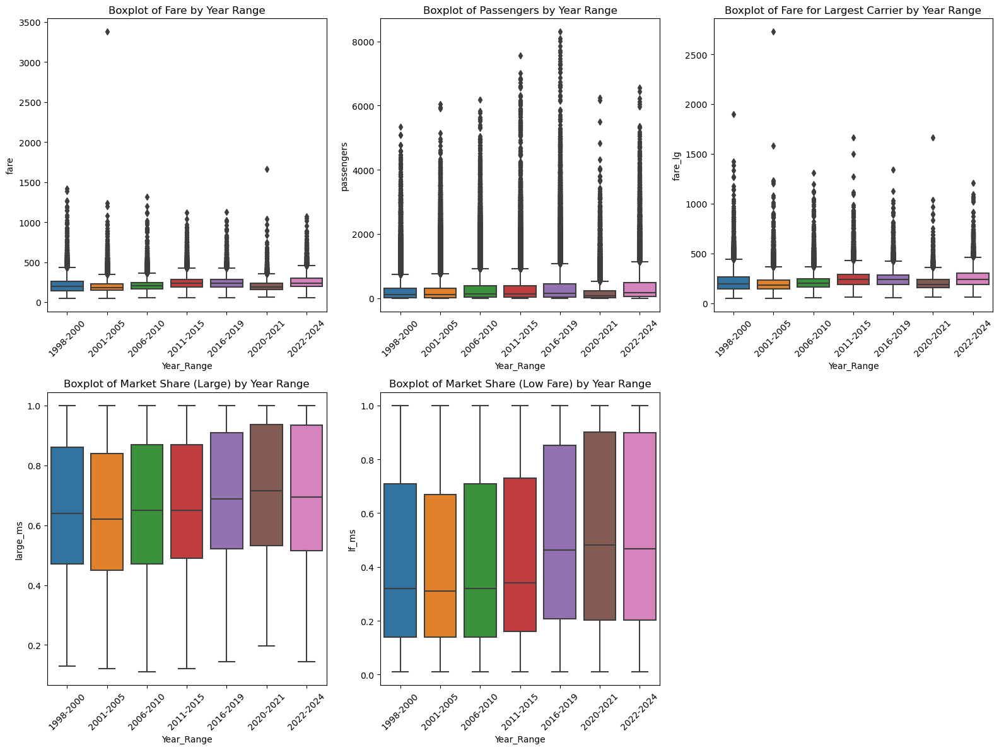

In [23]:
# List of columns to plot
columns = ['fare', 'passengers', 'fare_lg', 'large_ms', 'lf_ms']

titles = [
    'Boxplot of Fare by Year Range',
    'Boxplot of Passengers by Year Range',
    'Boxplot of Fare for Largest Carrier by Year Range',
    'Boxplot of Market Share (Large) by Year Range',
    'Boxplot of Market Share (Low Fare) by Year Range'
]

plt.figure(figsize=(16, 12))
for i in range(len(columns)):
    plt.subplot(2, 3, i + 1)  # Create a subplot for each plot
    sns.boxplot(data=airline, x='Year_Range', y=columns[i])
    plt.title(titles[i])
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


In [24]:
columns_with_outliers = ['fare', 'passengers', 'fare_lg']
medians = {column: airline[column].median() for column in columns_with_outliers}

for column in columns_with_outliers:
    
    Q1 = airline[column].quantile(0.25)
    Q3 = airline[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    airline[column] = np.where(
        (airline[column] < lower_bound) | (airline[column] > upper_bound),
        medians[column],
        airline[column]
    )


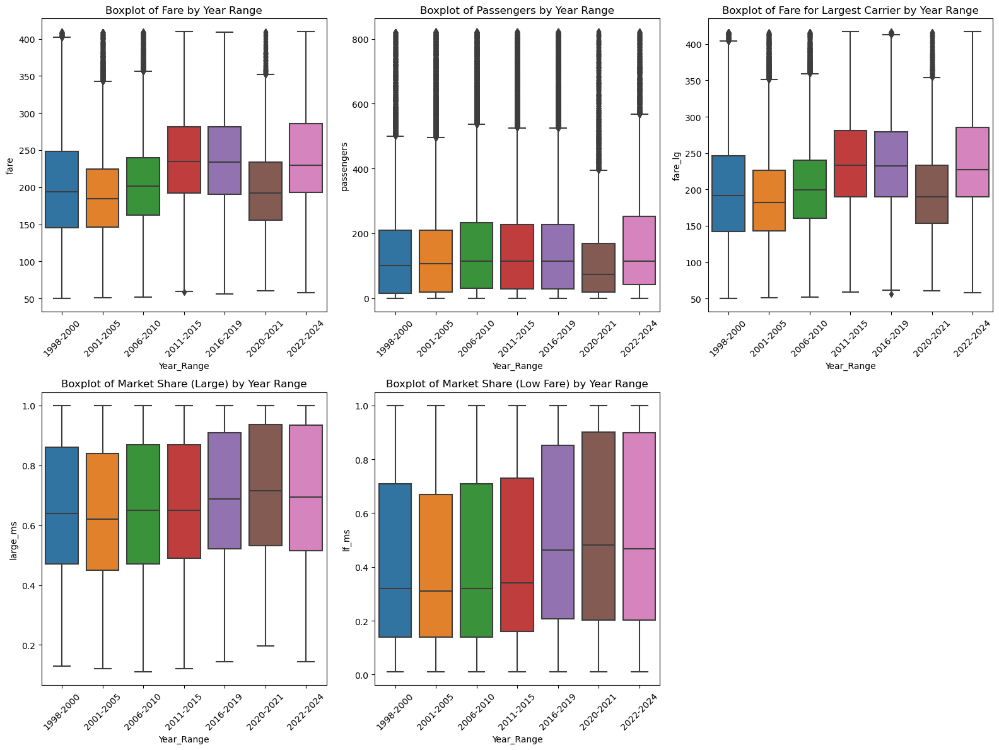

In [25]:
# List of columns to plot
columns = ['fare', 'passengers', 'fare_lg', 'large_ms', 'lf_ms']

titles = [
    'Boxplot of Fare by Year Range',
    'Boxplot of Passengers by Year Range',
    'Boxplot of Fare for Largest Carrier by Year Range',
    'Boxplot of Market Share (Large) by Year Range',
    'Boxplot of Market Share (Low Fare) by Year Range'
]

plt.figure(figsize=(16, 12))
for i in range(len(columns)):
    plt.subplot(2, 3, i + 1)  # Create a subplot for each plot
    sns.boxplot(data=airline, x='Year_Range', y=columns[i])
    plt.title(titles[i])
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


In [26]:
airline.shape

(244343, 19)

### Passenger Count Trend over the Years

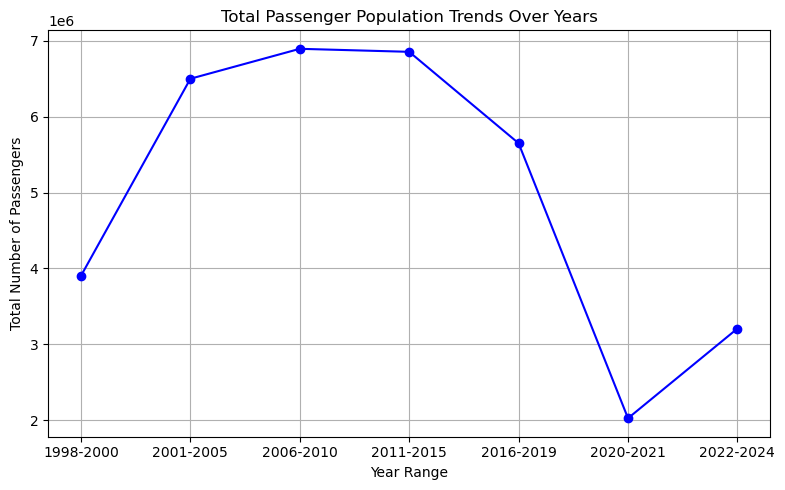

In [27]:
passenger_trends_over_years = airline.groupby('Year_Range')['passengers'].sum().reset_index()

plt.figure(figsize=(8, 5))
plt.plot(passenger_trends_over_years['Year_Range'], passenger_trends_over_years['passengers'], marker='o', linestyle='-', color='b')
plt.title('Total Passenger Population Trends Over Years')
plt.xlabel('Year Range')
plt.ylabel('Total Number of Passengers')
plt.grid(True)
plt.tight_layout()
plt.show()


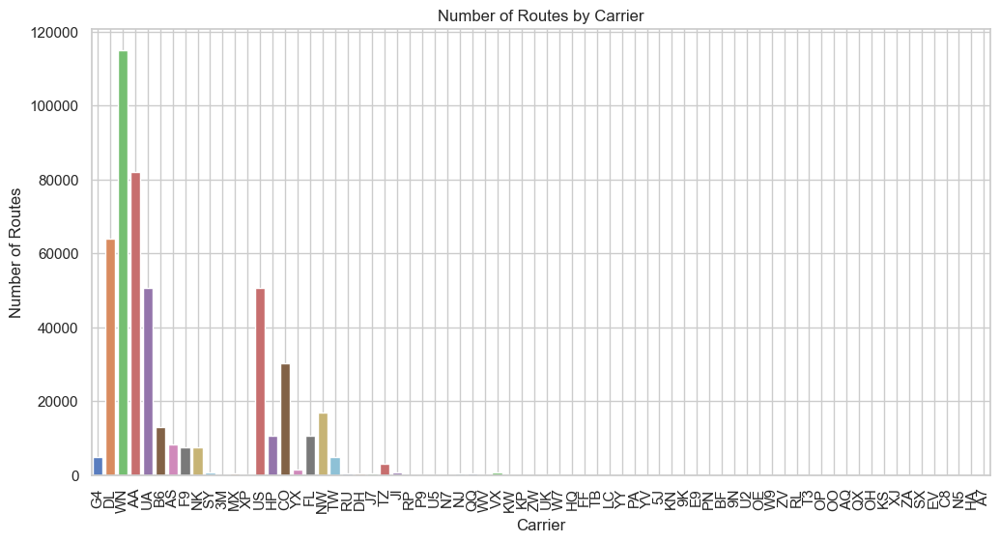

In [103]:

carrier_combined = pd.concat([airline['carrier_lg'], airline['carrier_low']], axis=0)
carrier_combined = carrier_combined.to_frame(name='unique_carriers')


plt.figure(figsize=(12, 6))
sns.countplot(x='unique_carriers', data=carrier_combined, palette='muted')
plt.title('Number of Routes by Carrier')
plt.xlabel('Carrier')
plt.ylabel('Number of Routes')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()




### Airlines Vs Passenger Count - Top 5 Airlines

In [28]:
year_range = airline.groupby(['Year_Range', 'carrier_lg'])['passengers'].sum().reset_index()

year_range_sorted = year_range.sort_values(by=['Year_Range', 'passengers'], ascending=[True, False])

top_5_airlines_per_range = year_range_sorted.groupby('Year_Range').head(5)

#print(top_5_airlines_per_range)
#bottom_5_airlines_per_range = year_range_sorted.groupby('Year_Range').tail(15)
#bottom_5_airlines_per_range

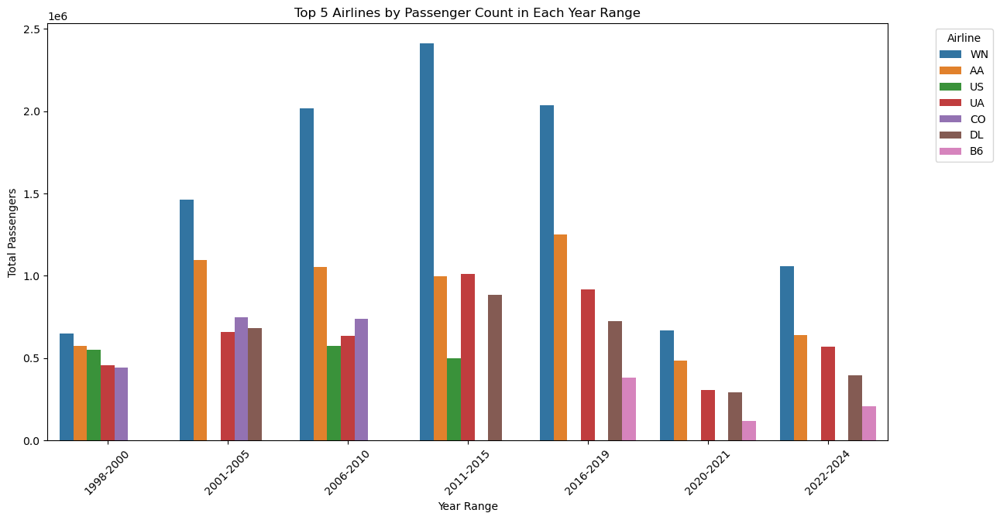

In [29]:
plt.figure(figsize=(14, 7))
sns.barplot(data=top_5_airlines_per_range, x='Year_Range', y='passengers', hue='carrier_lg')
plt.title('Top 5 Airlines by Passenger Count in Each Year Range')
plt.xlabel('Year Range')
plt.ylabel('Total Passengers')
plt.legend(title='Airline', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()


### TOP 5 Airlines by Passenger Count - Categorised by Quarters 

In [30]:
# Data of top 5 Airlines
top_5_airlines_data = airline[airline['carrier_lg'].isin(top_5_airlines_per_range['carrier_lg'])]

# Group by Year_Range, quarter, and carrier_lg to get total passenger counts
quarterly_passenger_counts = top_5_airlines_data.groupby(['Year_Range', 'quarter', 'carrier_lg'])['passengers'].sum().reset_index()

print(quarterly_passenger_counts.head(5))


  Year_Range  quarter carrier_lg  passengers
0  1998-2000        1         AA    135604.0
1  1998-2000        1         B6         0.0
2  1998-2000        1         CO    105758.0
3  1998-2000        1         DL     96845.0
4  1998-2000        1         UA    110856.0


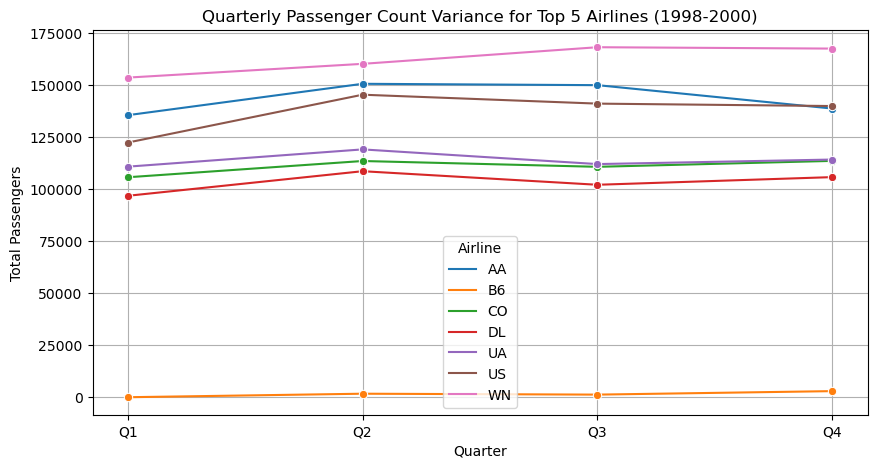

In [31]:
# Example for one year range
plt.figure(figsize=(10, 5))
subset = quarterly_passenger_counts[quarterly_passenger_counts['Year_Range'] == '1998-2000']
sns.lineplot(data=subset, x='quarter', y='passengers', hue='carrier_lg', marker='o')
plt.title('Quarterly Passenger Count Variance for Top 5 Airlines (1998-2000)')
plt.xlabel('Quarter')
plt.ylabel('Total Passengers')
plt.legend(title='Airline')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True)
plt.show()


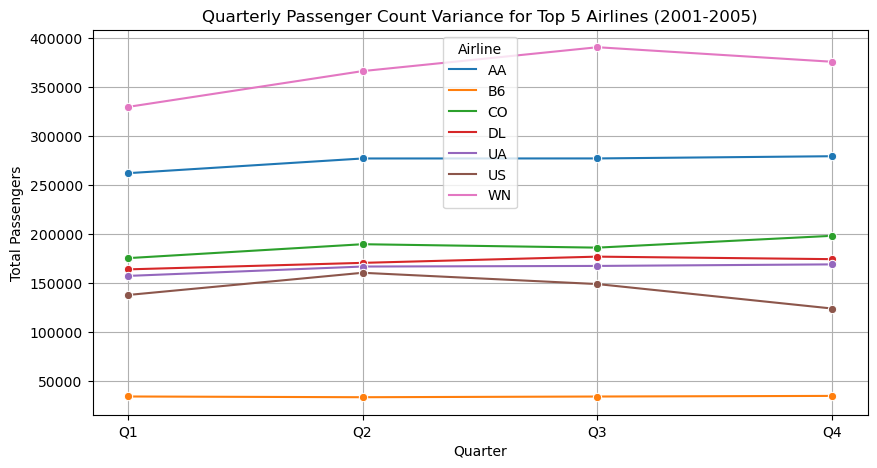

In [32]:
# Example for one year range
plt.figure(figsize=(10, 5))
subset = quarterly_passenger_counts[quarterly_passenger_counts['Year_Range'] == '2001-2005']
sns.lineplot(data=subset, x='quarter', y='passengers', hue='carrier_lg', marker='o')
plt.title('Quarterly Passenger Count Variance for Top 5 Airlines (2001-2005)')
plt.xlabel('Quarter')
plt.ylabel('Total Passengers')
plt.legend(title='Airline')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True)
plt.show()

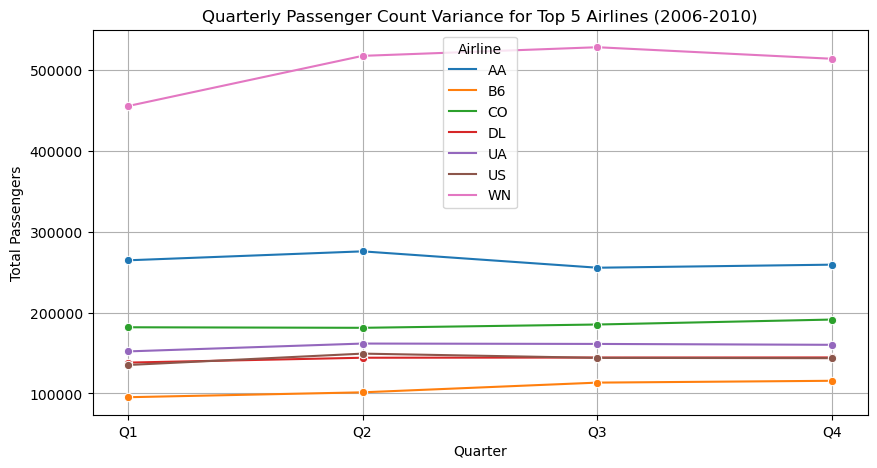

In [33]:
# Example for one year range
plt.figure(figsize=(10, 5))
subset = quarterly_passenger_counts[quarterly_passenger_counts['Year_Range'] == '2006-2010']
sns.lineplot(data=subset, x='quarter', y='passengers', hue='carrier_lg', marker='o')
plt.title('Quarterly Passenger Count Variance for Top 5 Airlines (2006-2010)')
plt.xlabel('Quarter')
plt.ylabel('Total Passengers')
plt.legend(title='Airline')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True)
plt.show()

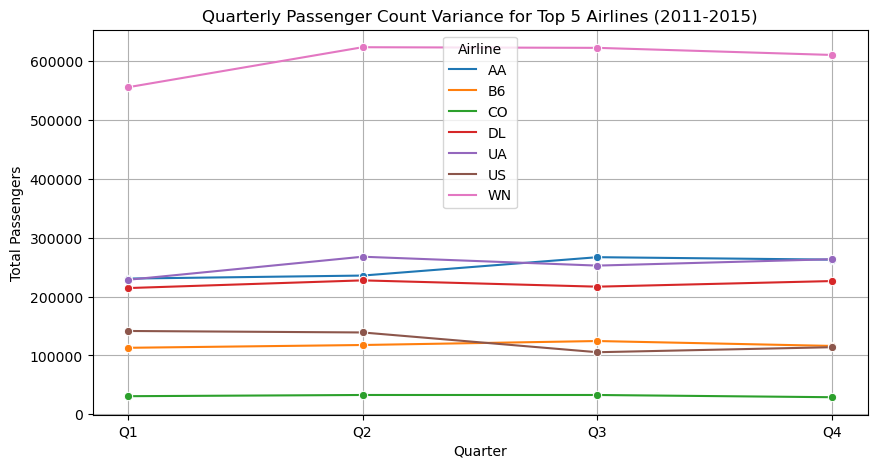

In [34]:
# Example for one year range
plt.figure(figsize=(10, 5))
subset = quarterly_passenger_counts[quarterly_passenger_counts['Year_Range'] == '2011-2015']
sns.lineplot(data=subset, x='quarter', y='passengers', hue='carrier_lg', marker='o')
plt.title('Quarterly Passenger Count Variance for Top 5 Airlines (2011-2015)')
plt.xlabel('Quarter')
plt.ylabel('Total Passengers')
plt.legend(title='Airline')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True)
plt.show()

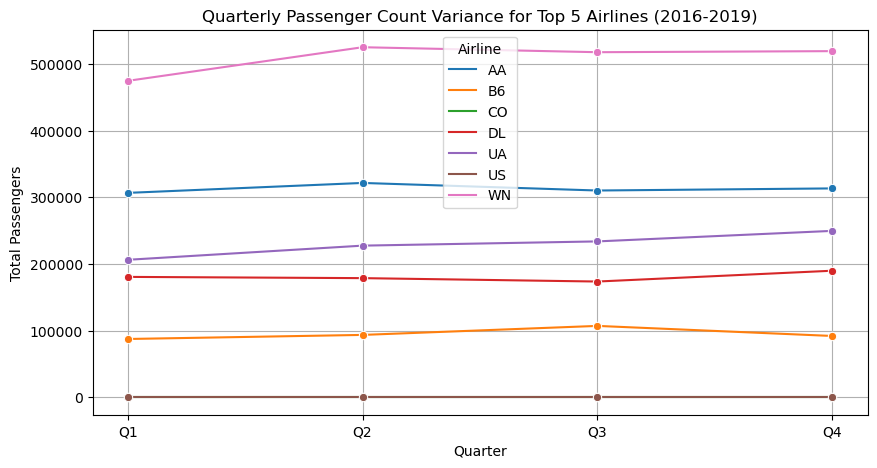

In [35]:
# Example for one year range
plt.figure(figsize=(10, 5))
subset = quarterly_passenger_counts[quarterly_passenger_counts['Year_Range'] == '2016-2019']
sns.lineplot(data=subset, x='quarter', y='passengers', hue='carrier_lg', marker='o')
plt.title('Quarterly Passenger Count Variance for Top 5 Airlines (2016-2019)')
plt.xlabel('Quarter')
plt.ylabel('Total Passengers')
plt.legend(title='Airline')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True)
plt.show()

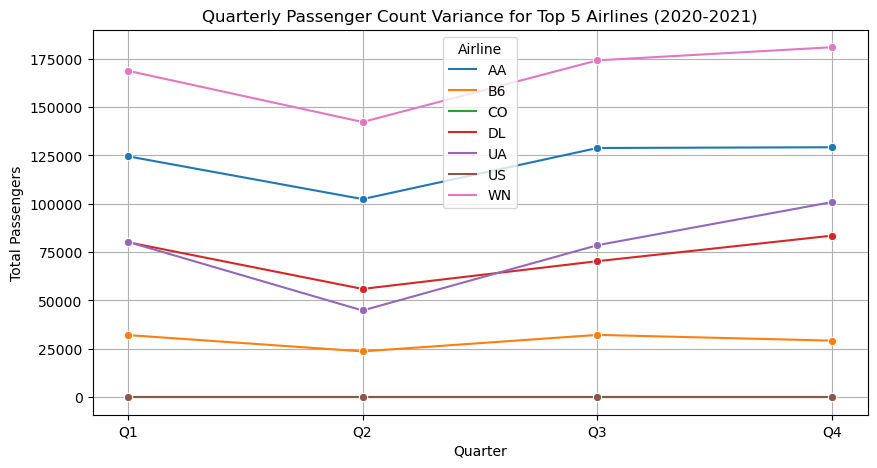

In [36]:
# Example for one year range
plt.figure(figsize=(10, 5))
subset = quarterly_passenger_counts[quarterly_passenger_counts['Year_Range'] == '2020-2021']
sns.lineplot(data=subset, x='quarter', y='passengers', hue='carrier_lg', marker='o')
plt.title('Quarterly Passenger Count Variance for Top 5 Airlines (2020-2021)')
plt.xlabel('Quarter')
plt.ylabel('Total Passengers')
plt.legend(title='Airline')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True)
plt.show()

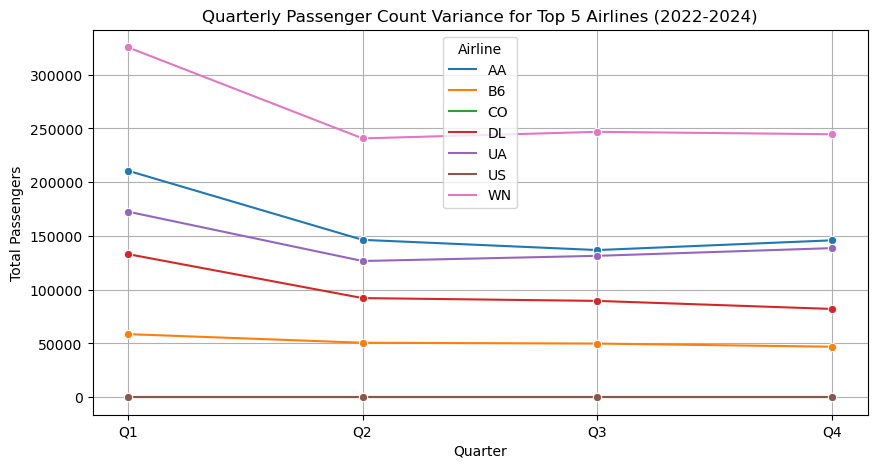

In [37]:
# Example for one year range
plt.figure(figsize=(10, 5))
subset = quarterly_passenger_counts[quarterly_passenger_counts['Year_Range'] == '2022-2024']
sns.lineplot(data=subset, x='quarter', y='passengers', hue='carrier_lg', marker='o')
plt.title('Quarterly Passenger Count Variance for Top 5 Airlines (2022-2024)')
plt.xlabel('Quarter')
plt.ylabel('Total Passengers')
plt.legend(title='Airline')
plt.xticks([1, 2, 3, 4], ['Q1', 'Q2', 'Q3', 'Q4'])
plt.grid(True)
plt.show()

### Proportion of Passenger Count Among Airlines 

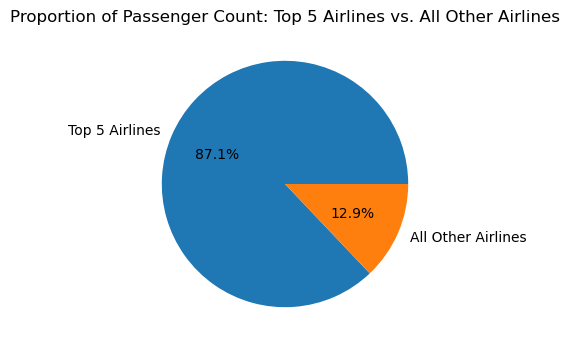

In [38]:
# Total passengers for the top 5 airlines
top_5_total_passengers = top_5_airlines_data['passengers'].sum()
# Total passengers for all other airlines
all_other_passengers = airline[~airline['carrier_lg'].isin(top_5_airlines_per_range['carrier_lg'])]['passengers'].sum()

proportions = pd.DataFrame({
    'Category': ['Top 5 Airlines', 'All Other Airlines'],
    'Passenger Count': [top_5_total_passengers, all_other_passengers]
})

plt.figure(figsize=(5, 4))
plt.pie(proportions['Passenger Count'], labels=proportions['Category'], autopct='%1.1f%%', colors=['#1f77b4', '#ff7f0e'])
plt.title('Proportion of Passenger Count: Top 5 Airlines vs. All Other Airlines')
plt.show()

### Airlines Vs Fare

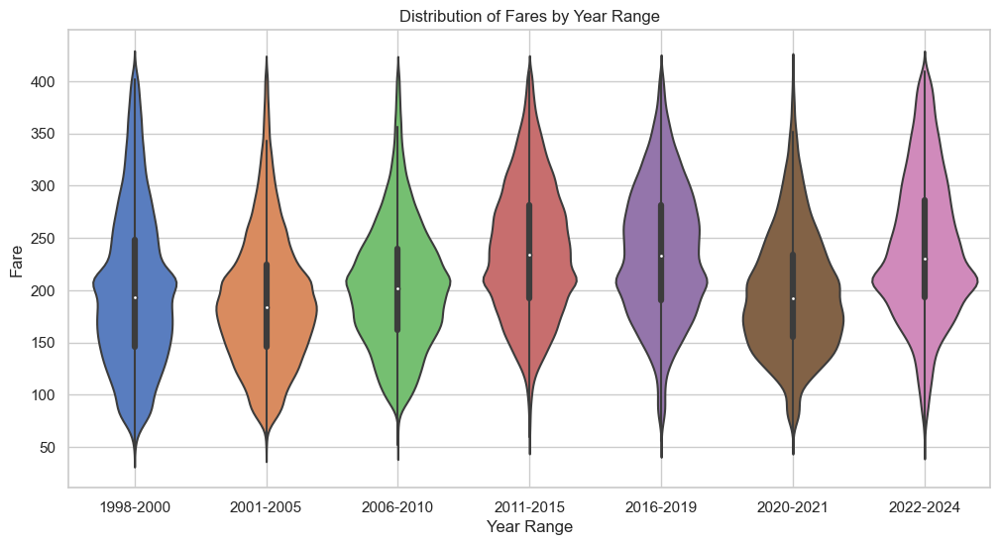

In [80]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='Year_Range', y='fare', data=airline, palette='muted')
plt.title('Distribution of Fares by Year Range')
plt.xlabel('Year Range')
plt.ylabel('Fare')
plt.grid(True)
plt.show()


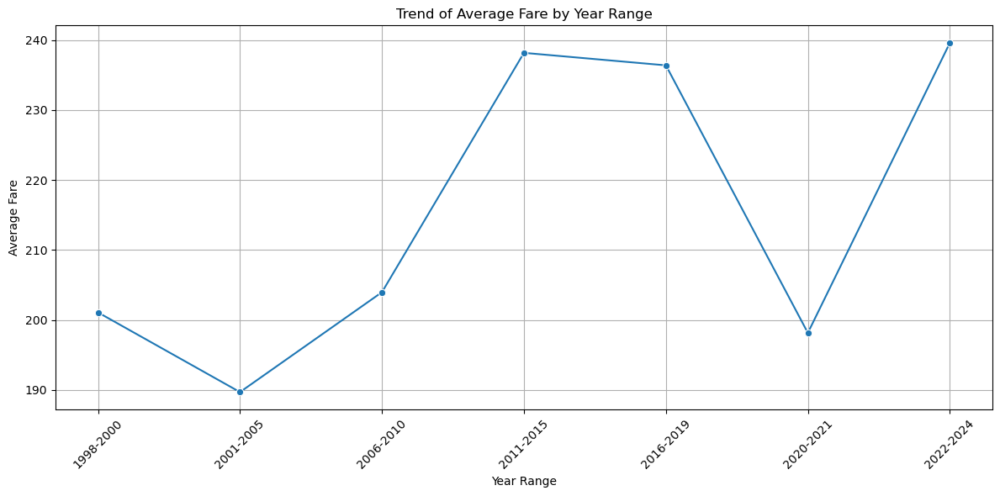

In [39]:
fare_trend = airline.groupby('Year_Range')['fare'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=fare_trend, x='Year_Range', y='fare', marker='o')
plt.title('Trend of Average Fare by Year Range')
plt.xlabel('Year Range')
plt.ylabel('Average Fare')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

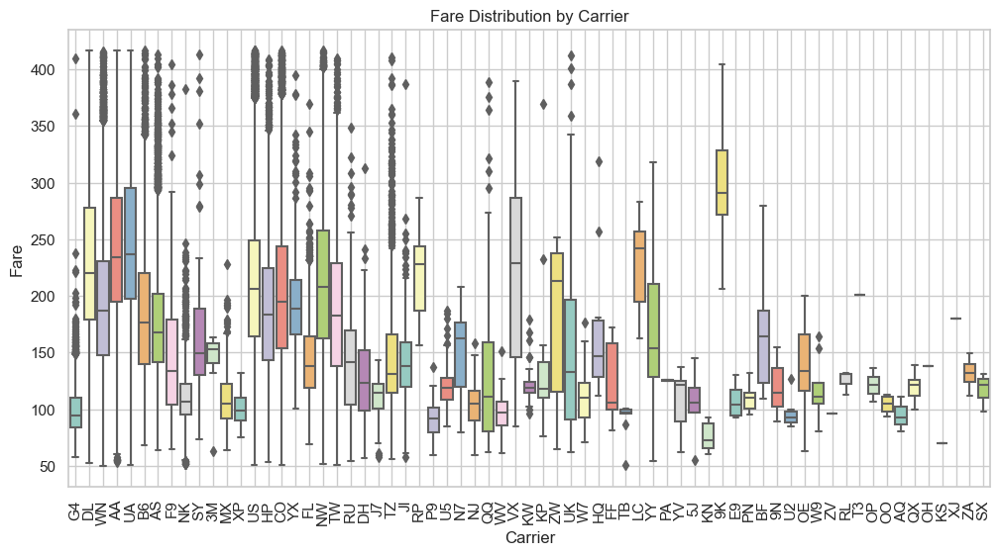

In [90]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='carrier_lg', y='fare_lg', data=airline, palette='Set3')
plt.title('Fare Distribution by Carrier')
plt.xlabel('Carrier')
plt.ylabel('Fare')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

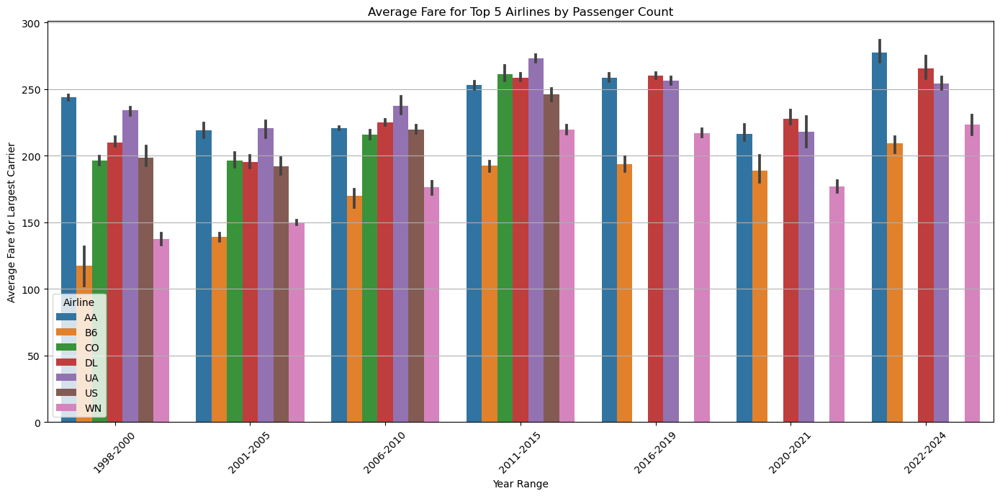

In [40]:
top_5_airlines_farelg = airline[airline['carrier_lg'].isin(top_5_airlines_per_range['carrier_lg'])]

yearly_fare_lg = top_5_airlines_farelg.groupby(['Year_Range', 'carrier_lg', 'quarter'])['fare_lg'].mean().reset_index()

plt.figure(figsize=(14, 7))
sns.barplot(data=yearly_fare_lg, x='Year_Range', y='fare_lg', hue='carrier_lg')

plt.title('Average Fare for Top 5 Airlines by Passenger Count')
plt.xlabel('Year Range')
plt.ylabel('Average Fare for Largest Carrier')
plt.xticks(rotation=45)
plt.legend(title='Airline')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


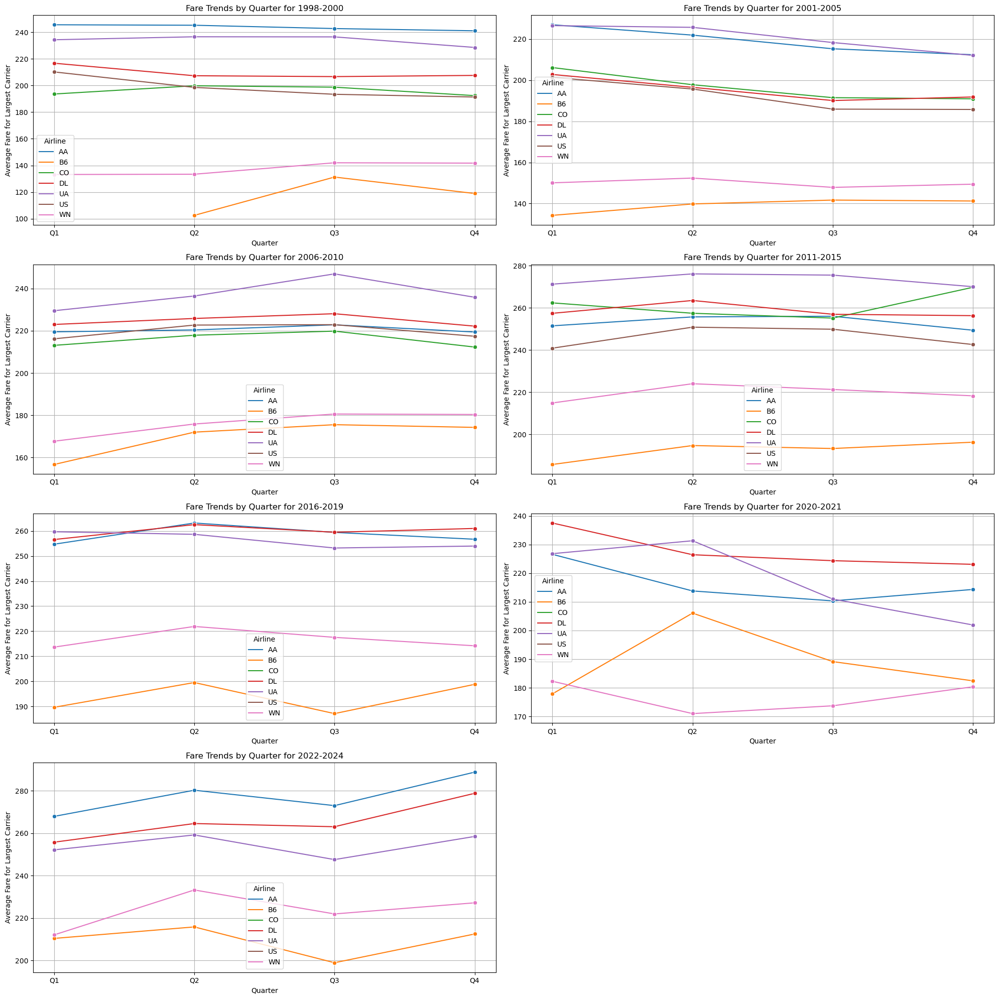

In [41]:
plt.figure(figsize=(20, 20))  
fare_trend = airline.groupby('Year_Range')['fare'].mean().reset_index()
for i, year_range in enumerate(fare_trend["Year_Range"]):
    data_subset = yearly_fare_lg[yearly_fare_lg['Year_Range'] == year_range]  # Data for the current year range
    
    plt.subplot(4, 2, i + 1)  
    sns.lineplot(data=data_subset, x='quarter', y='fare_lg', hue='carrier_lg', marker='o')
    plt.title(f'Fare Trends by Quarter for {year_range}')
    plt.xlabel('Quarter')
    plt.ylabel('Average Fare for Largest Carrier')
    plt.xticks(ticks=[1, 2, 3, 4], labels=['Q1', 'Q2', 'Q3', 'Q4'])
    plt.legend(title='Airline')
    plt.grid(True)

plt.tight_layout()
plt.show()

In [42]:
# Step 1: Filter the data to only include the top 5 airlines by carrier_lg
filtered_data = airline[airline['carrier_lg'].isin(top_5_airlines_per_range['carrier_lg'])]

# Step 2: Count the total occurrences of top 5 airlines in carrier_lg
total_top_5_count = filtered_data.shape[0]

# Step 3: Check for matches between carrier_lg and carrier_low
filtered_data['is_same_carrier'] = filtered_data['carrier_lg'] == filtered_data['carrier_low']

# Step 4: Count the number of times the carriers are the same
same_carrier_count = filtered_data['is_same_carrier'].sum()

# Step 5: Calculate the proportion of matches
proportion_same_carrier = same_carrier_count / total_top_5_count

# Output the results
print(f"Total occurrences of top 5 airlines: {total_top_5_count}")
print(f"The carrier_lg and carrier_low are the same {same_carrier_count} times among the top 5 airlines.")
print(f"Proportion of times carrier_lg and carrier_low are the same: {proportion_same_carrier:.2%}")


Total occurrences of top 5 airlines: 215069
The carrier_lg and carrier_low are the same 99626 times among the top 5 airlines.
Proportion of times carrier_lg and carrier_low are the same: 46.32%


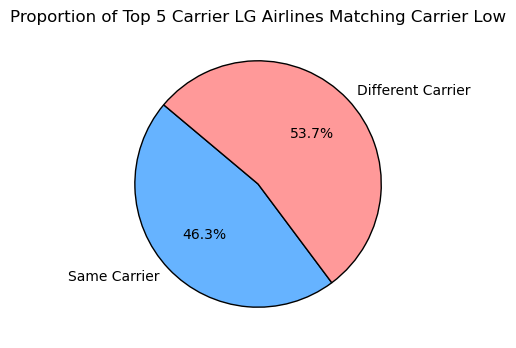

In [43]:
labels = ['Same Carrier', 'Different Carrier']
sizes = [same_carrier_count, total_top_5_count - same_carrier_count]
colors = ['#66b3ff', '#ff9999']

# Plotting the pie chart
plt.figure(figsize=(5, 4))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140, wedgeprops={'edgecolor': 'black'})

# Customize the plot
plt.title('Proportion of Top 5 Carrier LG Airlines Matching Carrier Low')
plt.show()

  carrier_low  counts
6          WN   50818
0          AA   30931
3          DL   25437
5          US   19794
4          UA   17447
2          CO   11500
1          B6    6677


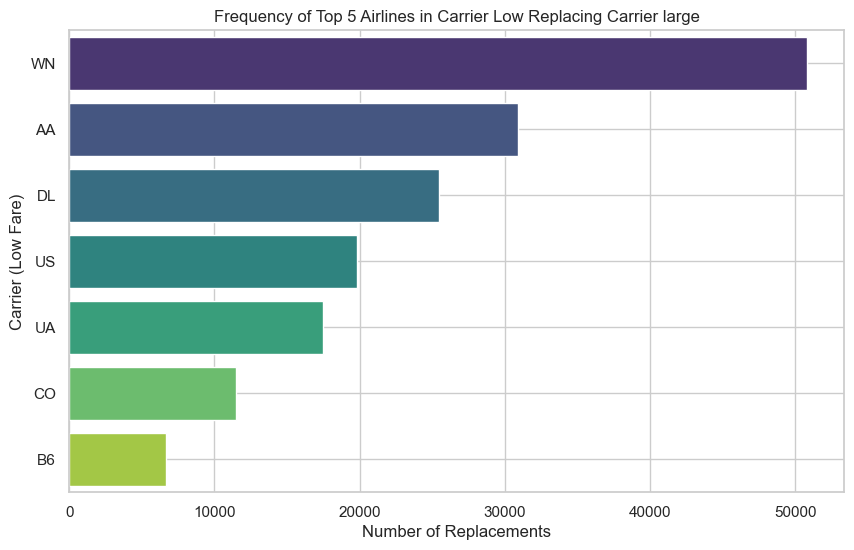

In [106]:
# Step 1: Top 5 Airlines by carrier_lg
top_5_airlines_per_range = year_range_sorted.groupby('Year_Range').head(5)
top_5_airlines_lg = top_5_airlines_per_range[['Year_Range', 'carrier_lg']].drop_duplicates()

# Step 2: Filter the DataFrame for top 5 carriers
top_5_airlines_data = airline[airline['carrier_lg'].isin(top_5_airlines_per_range['carrier_lg'])]

# Step 3: Check replacement counts
replacement_counts = top_5_airlines_data.groupby(['Year_Range', 'carrier_lg', 'carrier_low']).size().reset_index(name='counts')

# Step 4: Identify replacements
replacement_counts['replacement'] = replacement_counts.apply(
    lambda row: row['carrier_low'] if row['carrier_low'] in top_5_airlines_per_range['carrier_lg'].values else None, 
    axis=1
)

# Step 5: Filter and analyze replacements
replacement_counts = replacement_counts[~replacement_counts['replacement'].isna()]
replacement_summary = replacement_counts.groupby('carrier_low')['counts'].sum().reset_index()
replacement_summary = replacement_summary.sort_values(by='counts', ascending=False)

# Display the summary
print(replacement_summary)

plt.figure(figsize=(10, 6))
sns.barplot(x='counts', y='carrier_low', data=replacement_summary, palette='viridis')

# Customize the plot
plt.title('Frequency of Top 5 Airlines in Carrier Low Replacing Carrier large')
plt.xlabel('Number of Replacements')
plt.ylabel('Carrier (Low Fare)')
plt.grid(True)

# Show the plot
plt.show()


### Airlines Vs Miles Flown : Top 5 Airlines 

In [45]:
top_miles_airlines = airline.groupby(['Year_Range', 'carrier_lg'])['nsmiles'].sum().reset_index()

top_miles_airlines_sorted = top_miles_airlines.sort_values(by=['Year_Range', 'nsmiles'], ascending=[True, False])

top_5_miles_airlines = top_miles_airlines_sorted.groupby('Year_Range').head(5)


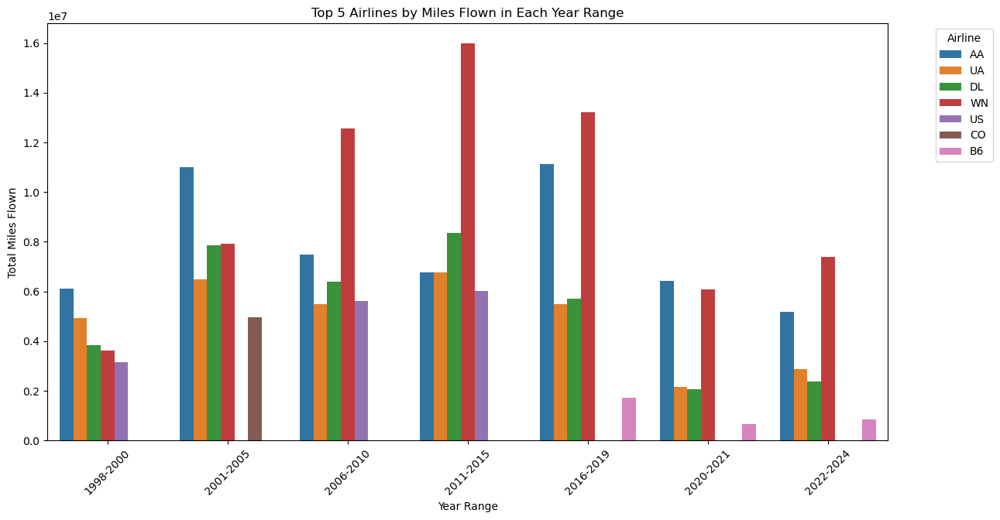

In [46]:
plt.figure(figsize=(14, 7))
sns.barplot(data=top_5_miles_airlines, x='Year_Range', y="nsmiles", hue='carrier_lg')
plt.title('Top 5 Airlines by Miles Flown in Each Year Range')
plt.xlabel('Year Range')
plt.ylabel('Total Miles Flown')
plt.legend(title='Airline', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

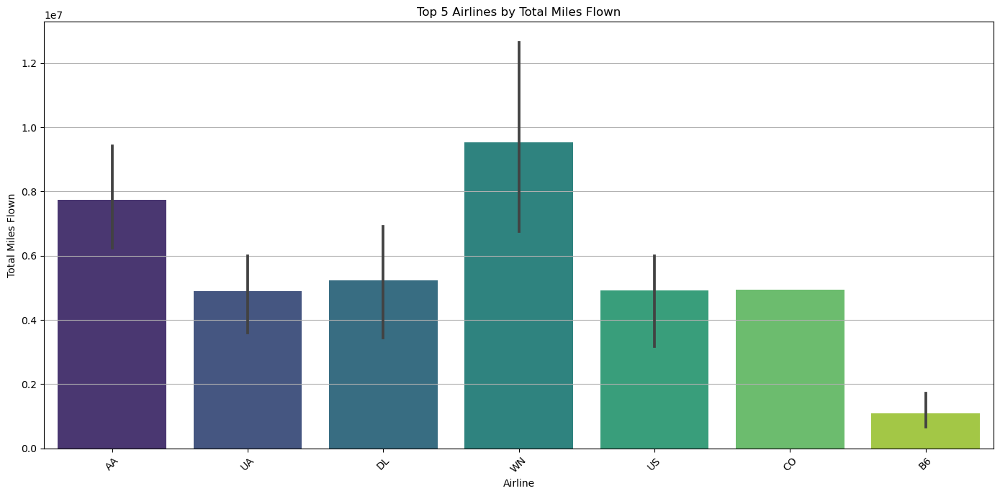

In [47]:
plt.figure(figsize=(14, 7))

sns.barplot(data=top_5_miles_airlines, x='carrier_lg', y='nsmiles', palette='viridis')

plt.title('Top 5 Airlines by Total Miles Flown')
plt.xlabel('Airline')
plt.ylabel('Total Miles Flown')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

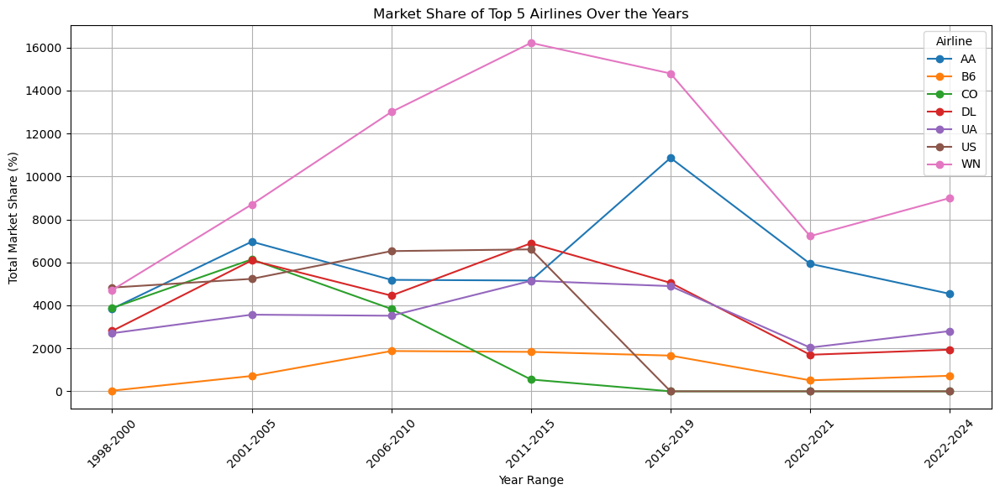

In [48]:
top_5_airlines = top_5_airlines_per_range['carrier_lg'].unique()
top_5_data = airline[airline['carrier_lg'].isin(top_5_airlines)][['Year_Range', 'carrier_lg', 'large_ms', 'lf_ms']]

aggregated_share = top_5_data.groupby(['Year_Range', 'carrier_lg'])[['large_ms', 'lf_ms']].sum().reset_index()

# Pivoting the data 
pivot_large_ms = aggregated_share.pivot(index='Year_Range', columns='carrier_lg', values='large_ms')
pivot_low_fare_ms = aggregated_share.pivot(index='Year_Range', columns='carrier_lg', values='lf_ms')

pivot_large_ms = pivot_large_ms.fillna(0)
pivot_low_fare_ms = pivot_low_fare_ms.fillna(0)

total_share = pivot_large_ms.add(pivot_low_fare_ms, fill_value=0)


plt.figure(figsize=(12, 6))

for column in total_share.columns:
    plt.plot(total_share.index, total_share[column], label=column, marker='o')

plt.title('Market Share of Top 5 Airlines Over the Years')
plt.xlabel('Year Range')
plt.ylabel('Total Market Share (%)')
plt.legend(title='Airline')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Airlines Vs Boarding & Destination Cities By Passenger Count

In [49]:
boarding_counts_yearly = airline.groupby(['Year_Range', 'city1'])['passengers'].sum().reset_index()
destination_counts_yearly = airline.groupby(['Year_Range', 'city2'])['passengers'].sum().reset_index()

top_5_boarding_airports_yearly = (boarding_counts_yearly.sort_values(['Year_Range', 'passengers'], ascending=[True, False])
                                  .groupby('Year_Range')
                                  .head(5)
                                  .reset_index(drop=True))

top_5_destination_airports_yearly = (destination_counts_yearly.sort_values(['Year_Range', 'passengers'], ascending=[True, False])
                                      .groupby('Year_Range')
                                      .head(5)
                                      .reset_index(drop=True))

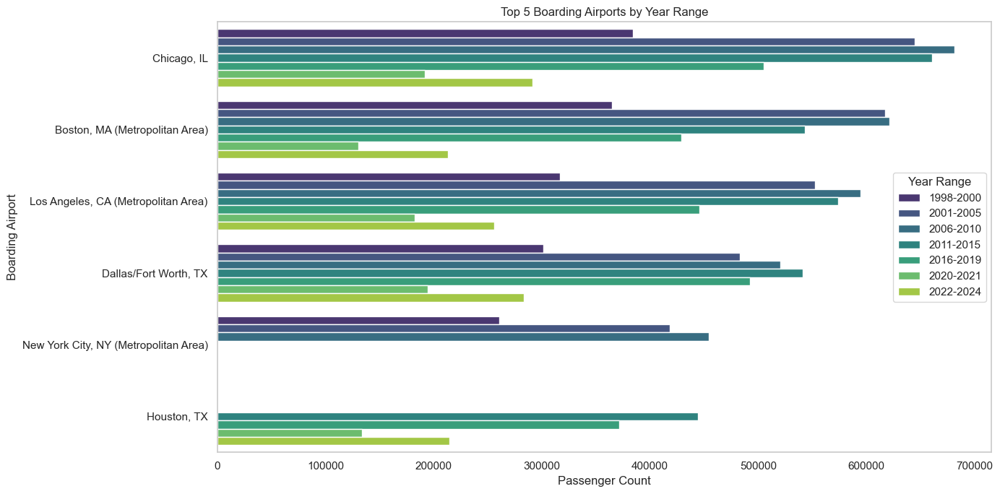

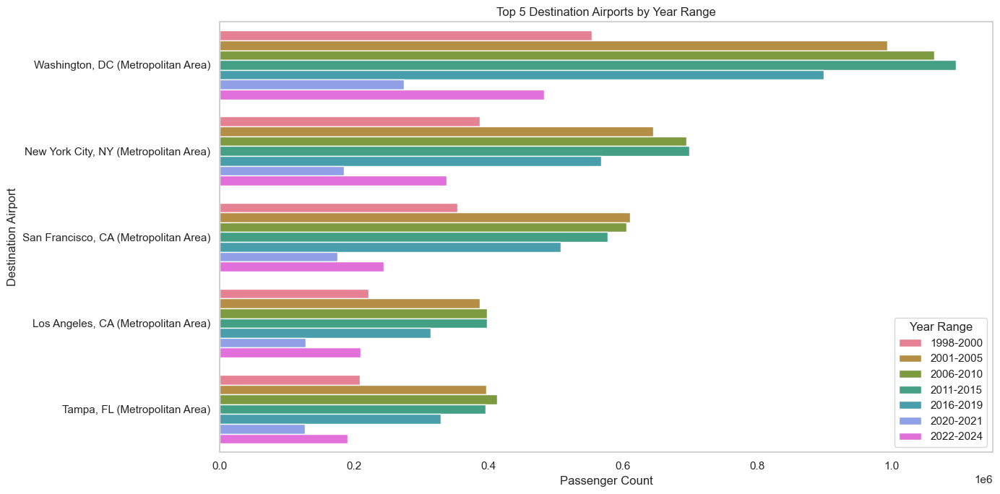

In [50]:
# Boarding
sns.set(style="whitegrid")
plt.figure(figsize=(14, 7))
sns.barplot(data=top_5_boarding_airports_yearly, x='passengers', y='city1', hue='Year_Range', palette="viridis")
plt.title('Top 5 Boarding Airports by Year Range')
plt.xlabel('Passenger Count')
plt.ylabel('Boarding Airport')
plt.legend(title='Year Range')
plt.grid(axis='x')
plt.tight_layout()
plt.show()

# Destination Airports
plt.figure(figsize=(14, 7))
sns.barplot(data=top_5_destination_airports_yearly, x='passengers', y='city2', hue='Year_Range', palette="husl")
plt.title('Top 5 Destination Airports by Year Range')
plt.xlabel('Passenger Count')
plt.ylabel('Destination Airport')
plt.legend(title='Year Range')
plt.grid(axis='x')
plt.tight_layout()
plt.show()


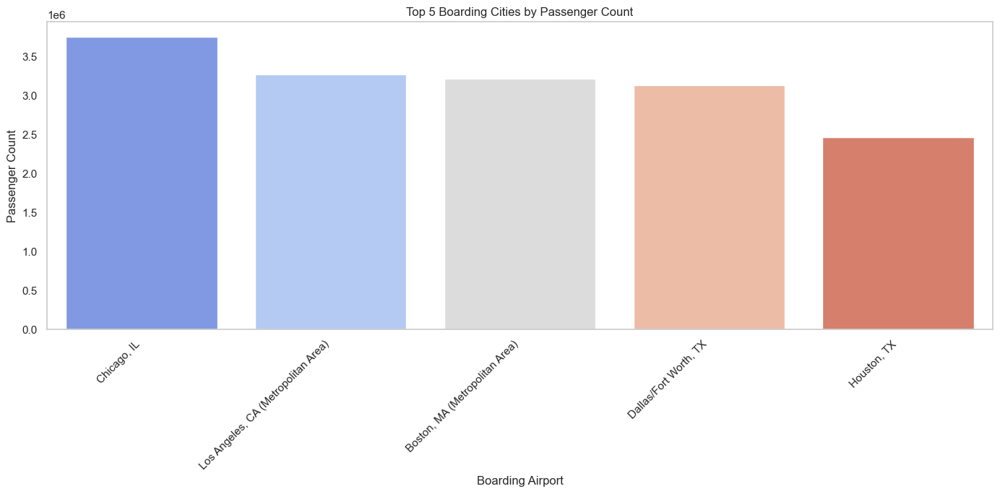

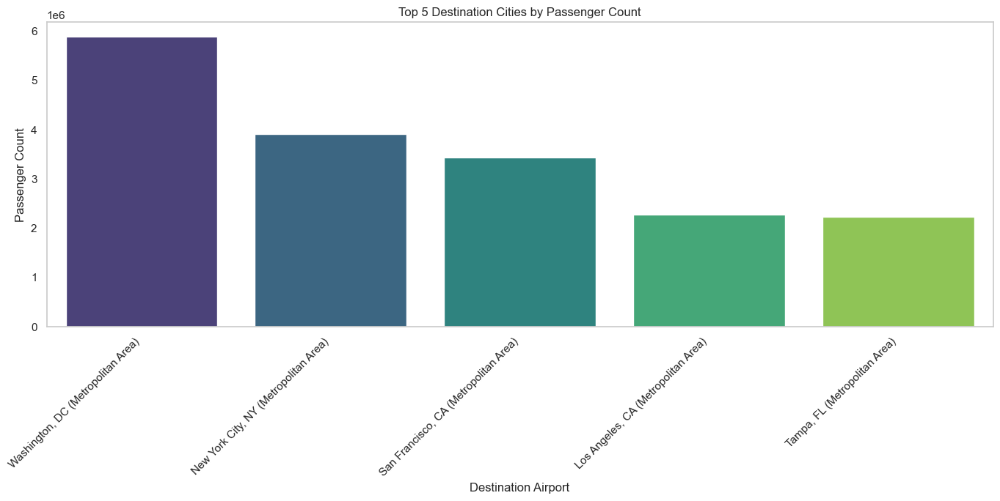

In [51]:
boarding_counts = airline.groupby('city1')['passengers'].sum().reset_index()
destination_counts = airline.groupby('city2')['passengers'].sum().reset_index()

top_5_boarding_cities = boarding_counts.nlargest(5, 'passengers')
top_5_destination_cities = destination_counts.nlargest(5, 'passengers')

# Boarding
plt.figure(figsize=(14, 7))
sns.barplot(data=top_5_boarding_cities, x='city1', y='passengers', palette='coolwarm')
plt.title('Top 5 Boarding Cities by Passenger Count')
plt.xlabel('Boarding Airport')
plt.ylabel('Passenger Count')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Destination
plt.figure(figsize=(14, 7))
sns.barplot(data=top_5_destination_cities, x='city2', y='passengers', palette='viridis')
plt.title('Top 5 Destination Cities by Passenger Count')
plt.xlabel('Destination Airport')
plt.ylabel('Passenger Count')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### Proportion of Passenger Count In Various Airports in Boadring City 

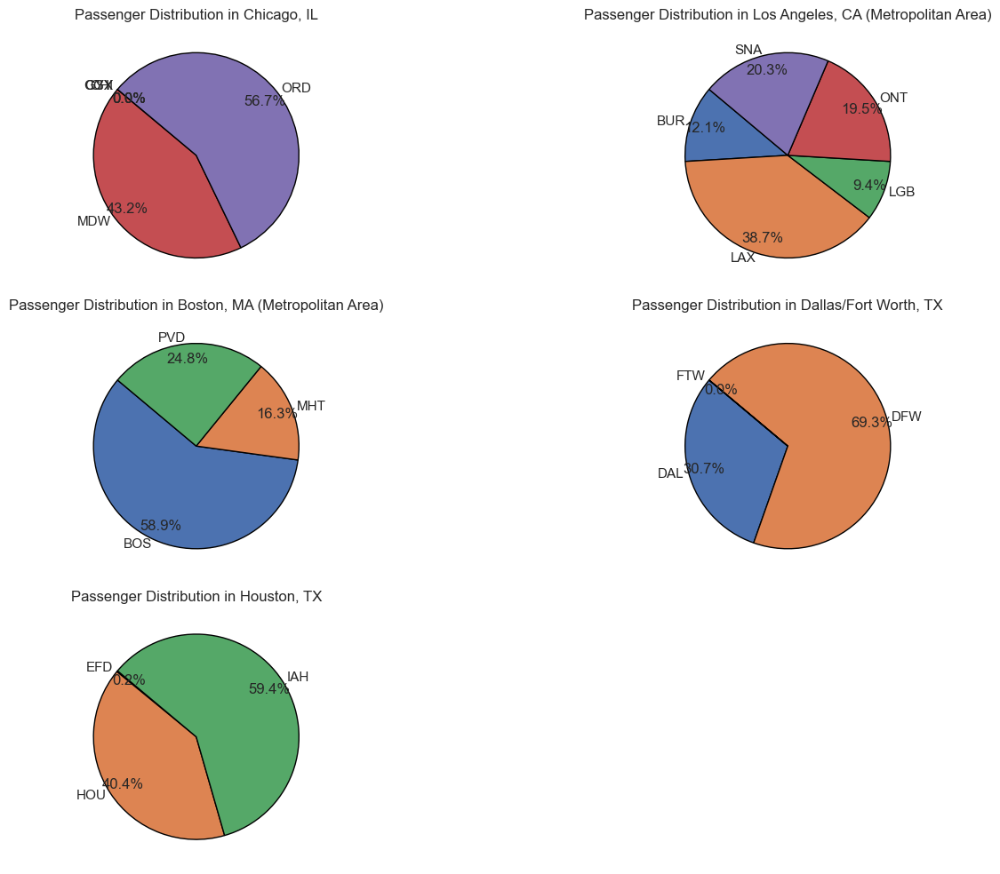

In [52]:

num_cities = len(top_5_boarding_cities)
plt.figure(figsize=(15, 10))

for i, (index, row) in enumerate(top_5_boarding_cities.iterrows()):
    city = row['city1']
    city_data = airline[airline['city1'] == city]
    
    airport_proportions = city_data.groupby('airport_1')['passengers'].sum().reset_index()
    
    plt.subplot(3,2 , i + 1) 
    plt.pie(airport_proportions['passengers'], labels=airport_proportions['airport_1'], autopct='%1.1f%%', startangle=140,
            labeldistance=1.05, pctdistance=0.85, wedgeprops={'linewidth': 1, 'edgecolor': 'black'})
    plt.title(f'Passenger Distribution in {city}')

plt.tight_layout()
plt.show()


### Proportion of Passenger Count In Various Airports in Boadring City 

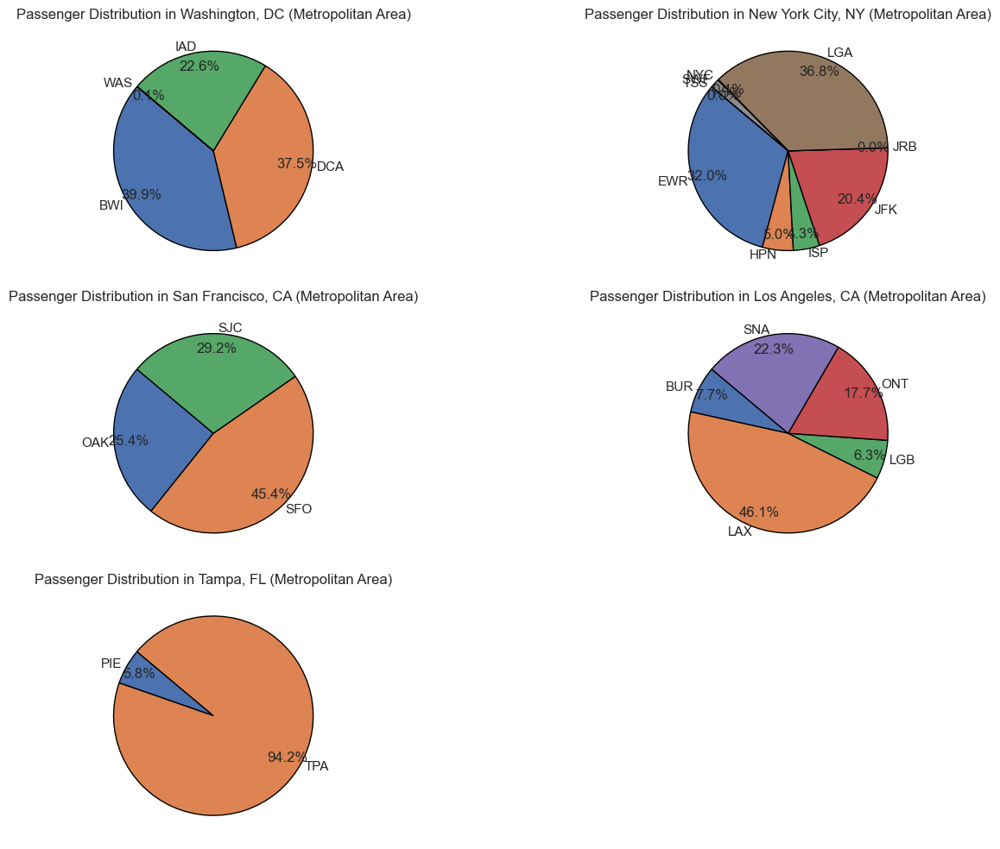

In [53]:
num_cities = len(top_5_destination_cities)
plt.figure(figsize=(15, 10))

for i, (index, row) in enumerate(top_5_destination_cities.iterrows()):
    city = row['city2']
    city_data = airline[airline['city2'] == city]
    
    airport_proportions = city_data.groupby('airport_2')['passengers'].sum().reset_index()
    
    plt.subplot(3,2 , i + 1)  
    plt.pie(airport_proportions['passengers'], labels=airport_proportions['airport_2'], autopct='%1.1f%%', startangle=140,
            labeldistance=1.05, pctdistance=0.85, wedgeprops={'linewidth': 1, 'edgecolor': 'black'})
    plt.title(f'Passenger Distribution in {city}')

plt.tight_layout()
plt.show()

### Proportion Of top 5 Boarding Cities & Destination Cities 

In [54]:
# Total passengers for boarding cities across all cities
total_passengers_boarding = boarding_counts['passengers'].sum()
total_passengers_top_5_boarding = top_5_boarding_cities['passengers'].sum()
total_passengers_all_other_boarding = total_passengers_boarding - total_passengers_top_5_boarding

# Total passengers for destination cities across all cities
total_passengers_destination = destination_counts['passengers'].sum()
total_passengers_top_5_destination = top_5_destination_cities['passengers'].sum()
total_passengers_all_other_destination = total_passengers_destination - total_passengers_top_5_destination


In [55]:
# Boarding airports proportions
boarding_proportions = pd.DataFrame({
    'Category': ['Top 5 Boarding Airports', 'All Other Boarding Airports'],
    'Passenger Count': [total_passengers_top_5_boarding, total_passengers_all_other_boarding]
})

# Destination airports proportions
destination_proportions = pd.DataFrame({
    'Category': ['Top 5 Destination Airports', 'All Other Destination Airports'],
    'Passenger Count': [total_passengers_top_5_destination, total_passengers_all_other_destination]
})


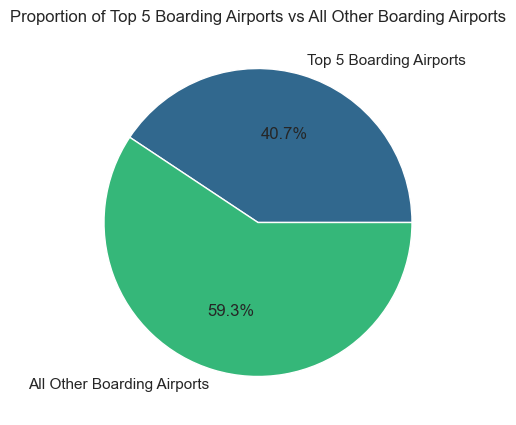

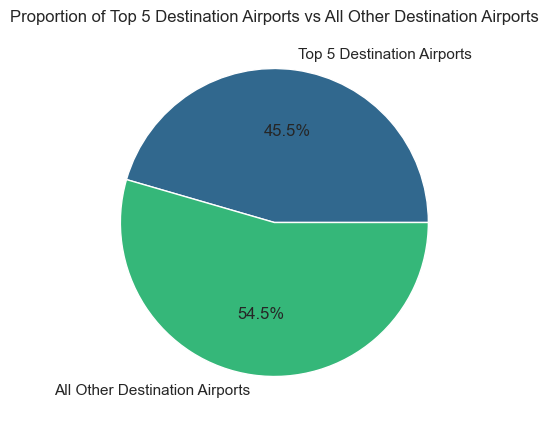

In [56]:
# Boarding 
plt.figure(figsize=(5, 5))
plt.pie(
    boarding_proportions['Passenger Count'],
    labels=boarding_proportions['Category'],
    autopct='%1.1f%%',
    colors=sns.color_palette("viridis", len(boarding_proportions))
)
plt.title('Proportion of Top 5 Boarding Airports vs All Other Boarding Airports')
plt.show()

# Destination 
plt.figure(figsize=(5, 5))
plt.pie(
    destination_proportions['Passenger Count'],
    labels=destination_proportions['Category'],
    autopct='%1.1f%%',
    colors=sns.color_palette("viridis", len(destination_proportions))
)
plt.title('Proportion of Top 5 Destination Airports vs All Other Destination Airports')
plt.show()


### Top 5 Boarding & Destination  City Pairs

Top 5 Boarding and Destination City Pairs:
                                              city_pair  passengers
932   Los Angeles, CA (Metropolitan Area) to San Fra...    357455.0
911   Los Angeles, CA (Metropolitan Area) to New Yor...    262997.0
774   Houston, TX to Washington, DC (Metropolitan Area)    222667.0
1236  San Francisco, CA (Metropolitan Area) to Washi...    222091.0
201   Boston, MA (Metropolitan Area) to Washington, ...    215587.0


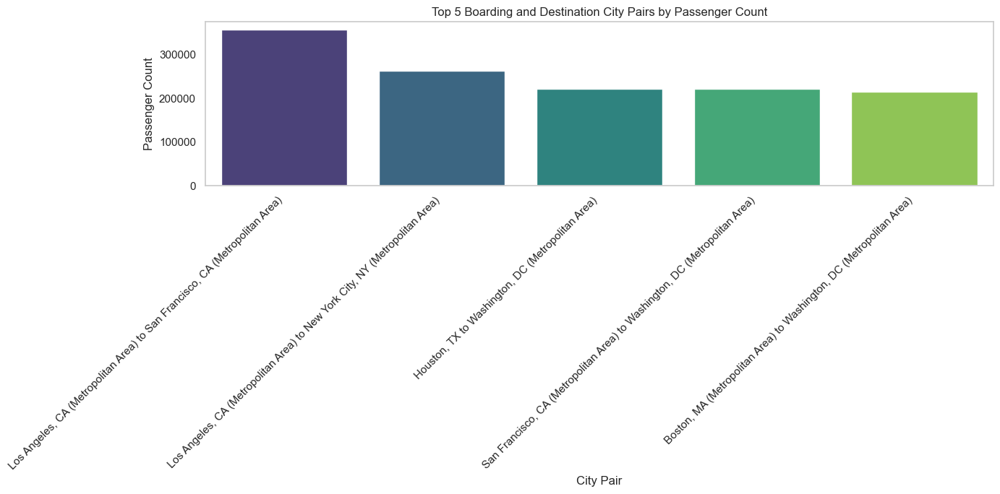

In [57]:
# City Pairs
airline['city_pair'] = airline['city1'] + ' to ' + airline['city2']

# Passengers Sum of City pairs
pair_passengers = airline.groupby('city_pair')['passengers'].sum().reset_index()

top_5_pairs = pair_passengers.sort_values(by='passengers', ascending=False).head(5)

print("Top 5 Boarding and Destination City Pairs:")
print(top_5_pairs)

plt.figure(figsize=(14, 7))
sns.barplot(data=top_5_pairs, x='city_pair', y='passengers', palette='viridis')

plt.title('Top 5 Boarding and Destination City Pairs by Passenger Count')
plt.xlabel('City Pair')
plt.ylabel('Passenger Count')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


### Passenger Count trends For Top 5 City Pairs by Year Range

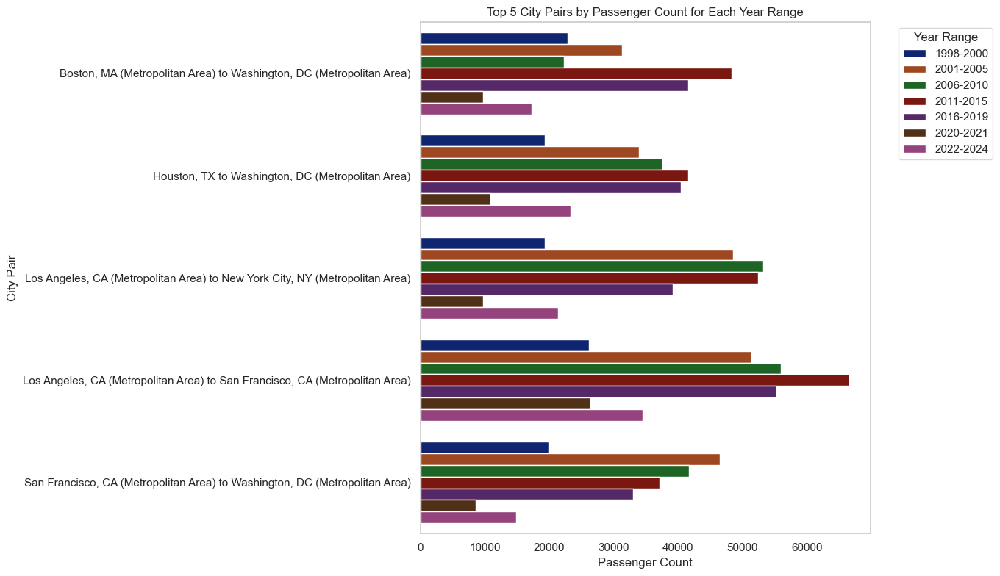

In [58]:
top_5_data = airline[airline['city_pair'].isin(top_5_pairs['city_pair'])]
agg_data = top_5_data.groupby(['Year_Range', 'city_pair'])['passengers'].sum().reset_index()

sns.set(style="whitegrid")
plt.figure(figsize=(14, 8))
sns.barplot(data=agg_data, x='passengers', y='city_pair', hue='Year_Range', palette='dark')
plt.title('Top 5 City Pairs by Passenger Count for Each Year Range')
plt.xlabel('Passenger Count')
plt.ylabel('City Pair')
plt.legend(title='Year Range', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')
plt.tight_layout()
plt.show()

### Passenger Count trends For Top 5 City Pairs Over time

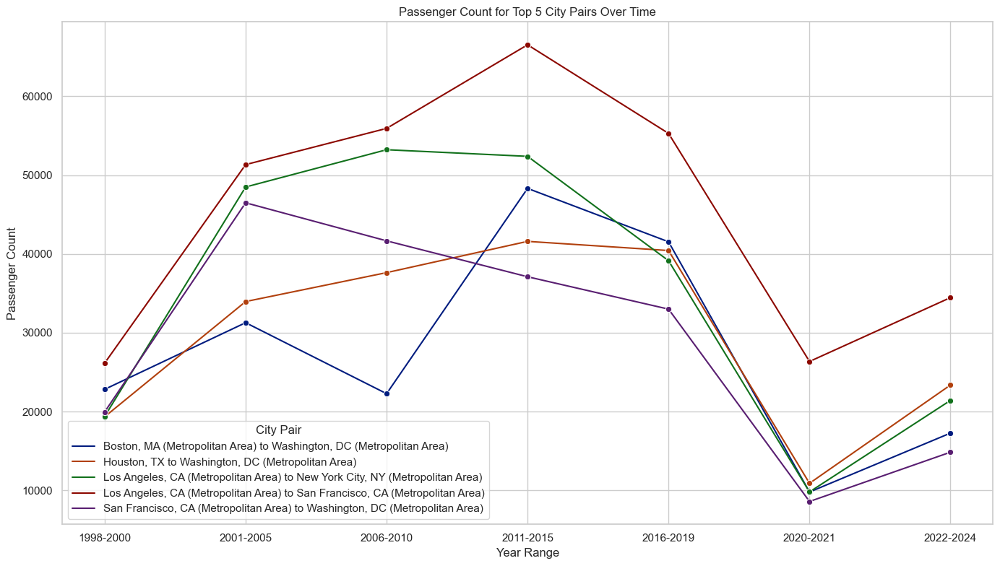

In [59]:
sns.set(style="whitegrid")
plt.figure(figsize=(14, 8))
sns.lineplot(data=agg_data, x='Year_Range', y='passengers', hue='city_pair', marker='o', palette='dark')
plt.title('Passenger Count for Top 5 City Pairs Over Time')
plt.xlabel('Year Range')
plt.ylabel('Passenger Count')
plt.legend(title='City Pair')
plt.grid(True)
plt.tight_layout()
plt.show()

### Fare trends For Top 5 City Pairs Over time

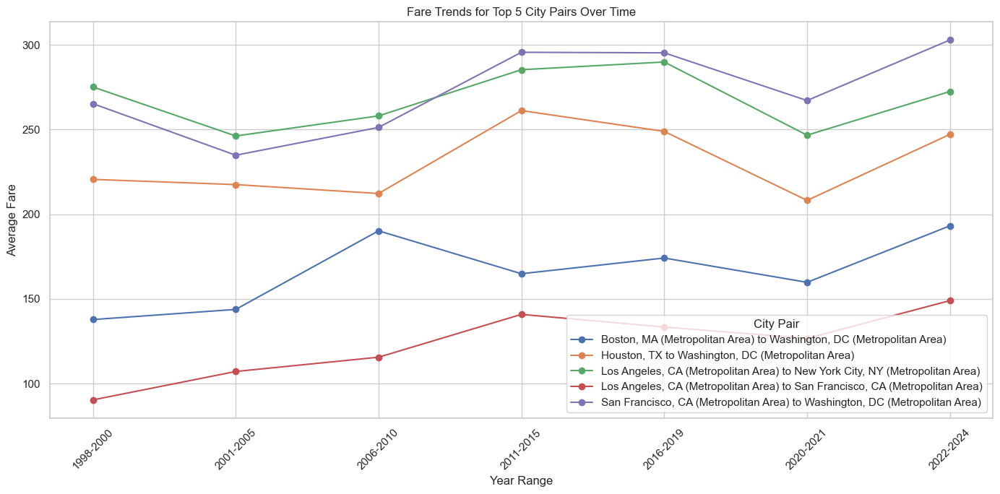

In [60]:
top_5_pairs_data = airline[airline['city_pair'].isin(top_5_pairs['city_pair'])]
fare_trends = top_5_pairs_data.groupby(['Year_Range', 'city_pair'])['fare'].mean().reset_index()
plt.figure(figsize=(14, 7))
for city_pair, group_data in fare_trends.groupby('city_pair'):
    plt.plot(group_data['Year_Range'], group_data['fare'], label=city_pair, marker='o')

plt.title('Fare Trends for Top 5 City Pairs Over Time')
plt.xlabel('Year Range')
plt.ylabel('Average Fare')
plt.legend(title='City Pair')
plt.grid(True)
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()


### Pairplot

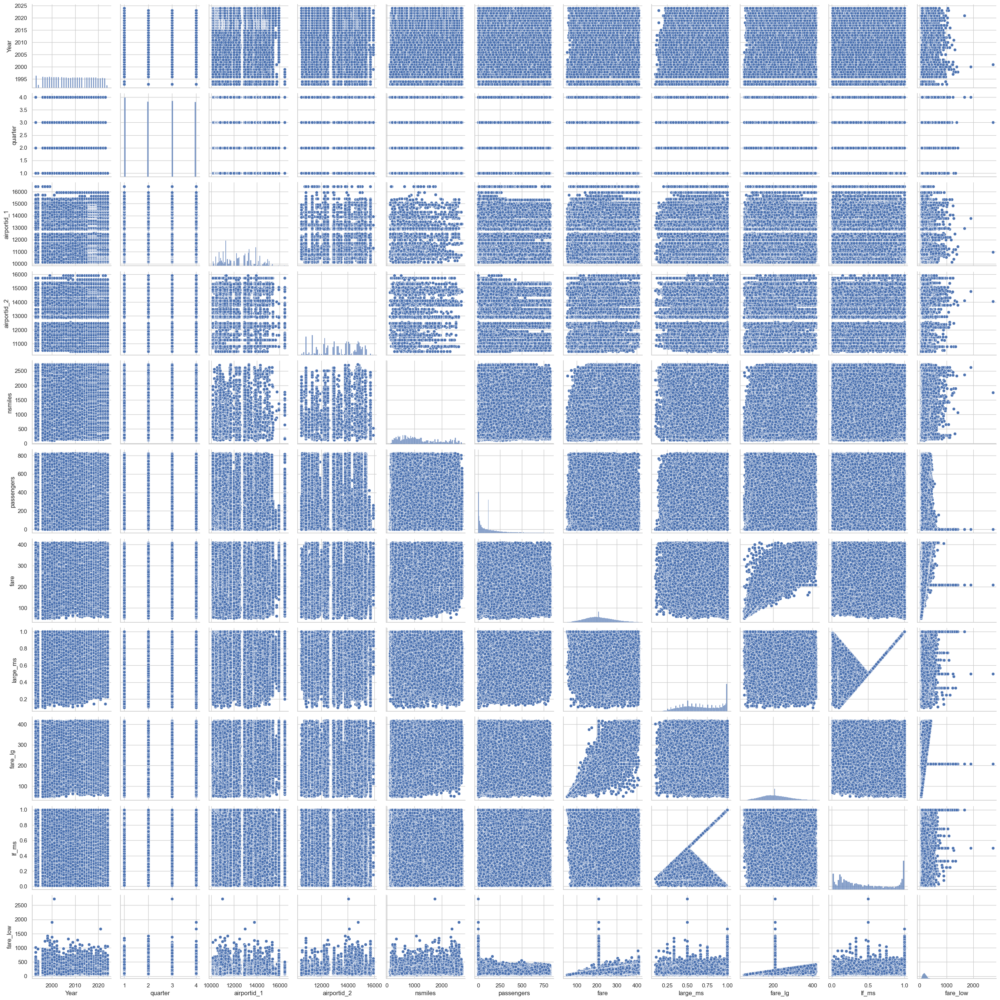

In [61]:
sns.pairplot(airline)
plt.show()

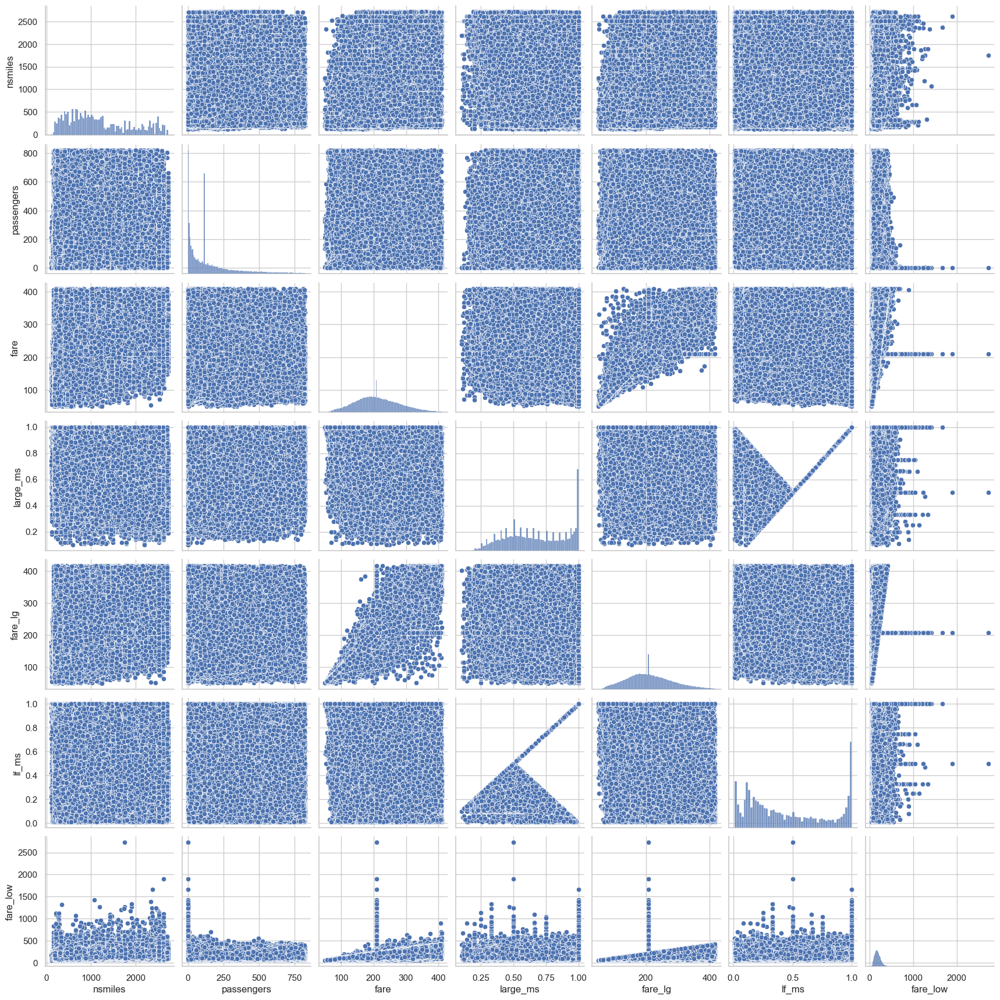

In [62]:
columns_for_pairplot = ['nsmiles', 'passengers', 'fare', 'large_ms', 'fare_lg', 'lf_ms', 'fare_low']
sns.pairplot(airline[columns_for_pairplot])
plt.show()

### Coorelation 

In [63]:
columns_corr = ['nsmiles', 'passengers', 'fare', 'large_ms', 'fare_lg', 'lf_ms', 'fare_low']
matrix = airline[columns_corr]

correlation_matrix = matrix.corr()
correlation_matrix

,nsmiles,passengers,fare,large_ms,fare_lg,lf_ms,fare_low
nsmiles,1.000000,-0.108210,0.519035,-0.401413,0.481573,-0.252953,0.416711
passengers,-0.108210,1.000000,-0.176622,0.027307,-0.142778,-0.095500,-0.211381
fare,0.519035,-0.176622,1.000000,-0.226820,0.928893,-0.242194,0.732638
large_ms,-0.401413,0.027307,-0.226820,1.000000,-0.210654,0.532854,-0.082080
fare_lg,0.481573,-0.142778,0.928893,-0.210654,1.000000,-0.282293,0.692591
lf_ms,-0.252953,-0.095500,-0.242194,0.532854,-0.282293,1.000000,0.057286
fare_low,0.416711,-0.211381,0.732638,-0.082080,0.692591,0.057286,1.000000


### Heatmap

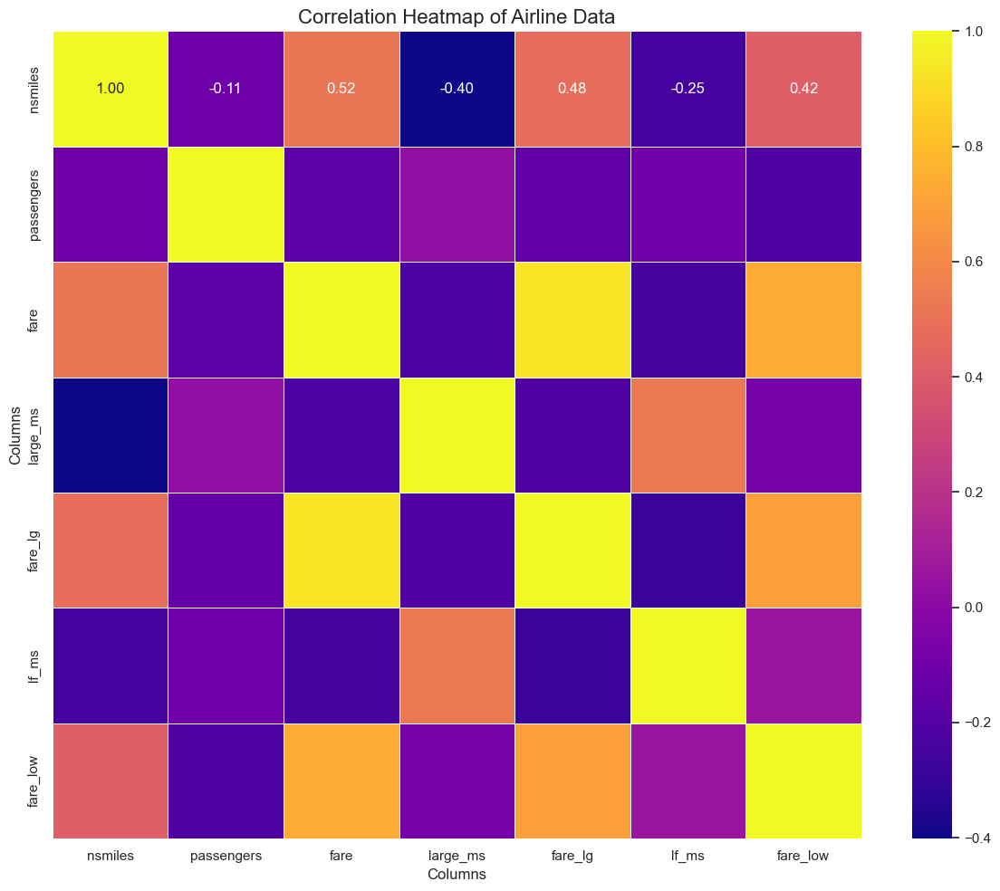

In [64]:
plt.figure(figsize=(12, 10))

sns.heatmap(correlation_matrix, annot=True, cmap='plasma', fmt='.2f', linewidths=0.5)


plt.title('Correlation Heatmap of Airline Data', fontsize=16)
plt.xlabel('Columns', fontsize=12)
plt.ylabel('Columns', fontsize=12)
plt.tight_layout()

plt.show()

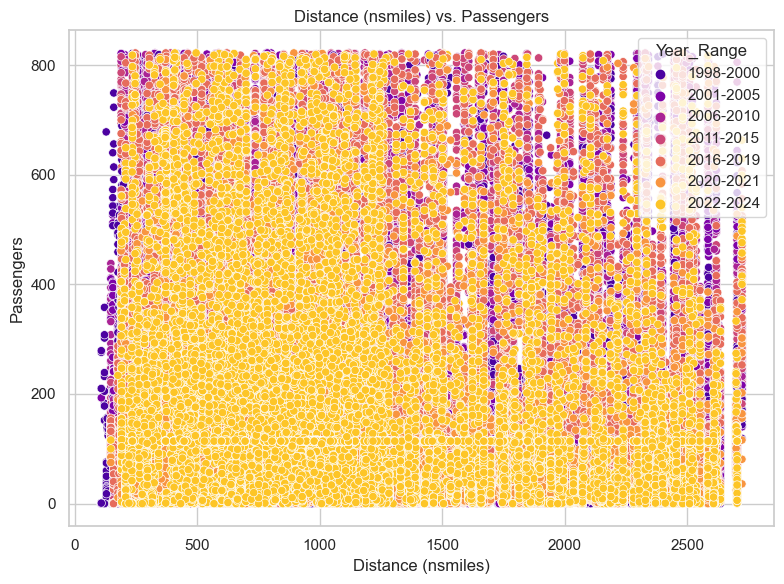

In [71]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=airline, x='nsmiles', y='passengers', hue='Year_Range', palette='plasma', marker='o')
plt.title('Distance (nsmiles) vs. Passengers')
plt.xlabel('Distance (nsmiles)')
plt.ylabel('Passengers')
plt.grid(True)
plt.tight_layout()
plt.show()


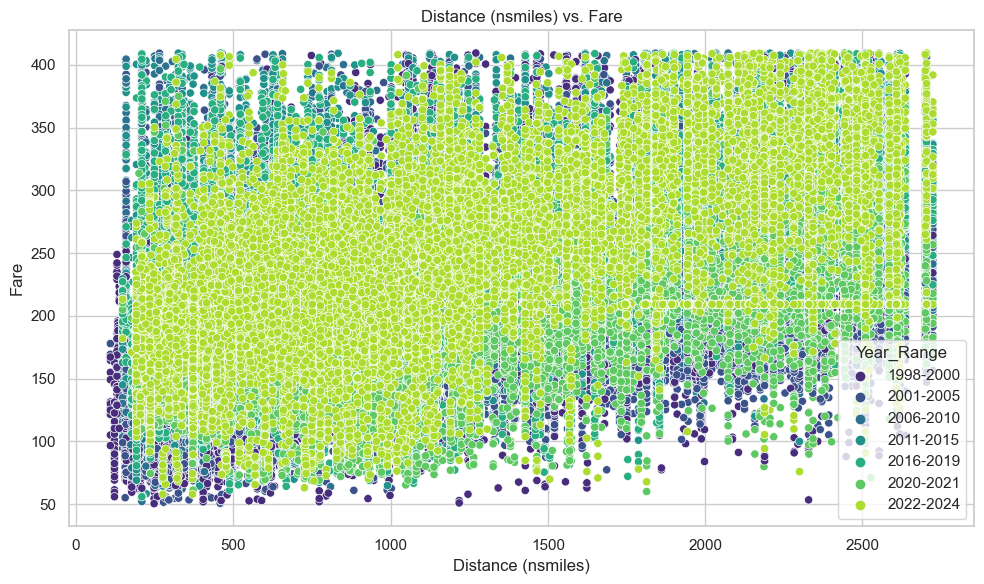

In [70]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=airline, x='nsmiles', y='fare', hue='Year_Range', palette='viridis', marker='o')
plt.title('Distance (nsmiles) vs. Average Fare')
plt.xlabel('Distance (nsmiles)')
plt.ylabel('Fare')
plt.grid(True)
plt.tight_layout()
plt.show()


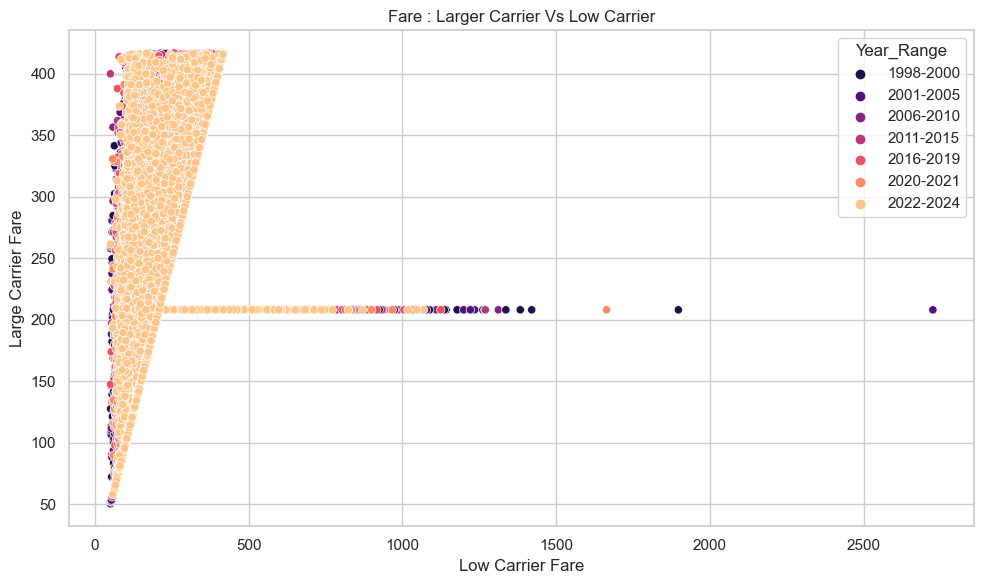

In [77]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=airline, x='fare_low', y='fare_lg', hue='Year_Range', palette='magma', marker='o')
plt.title('Fare : Larger Carrier Vs Low Carrier')
plt.xlabel('Low Carrier Fare')
plt.ylabel('Large Carrier Fare')
plt.grid(True)
plt.tight_layout()
plt.show()


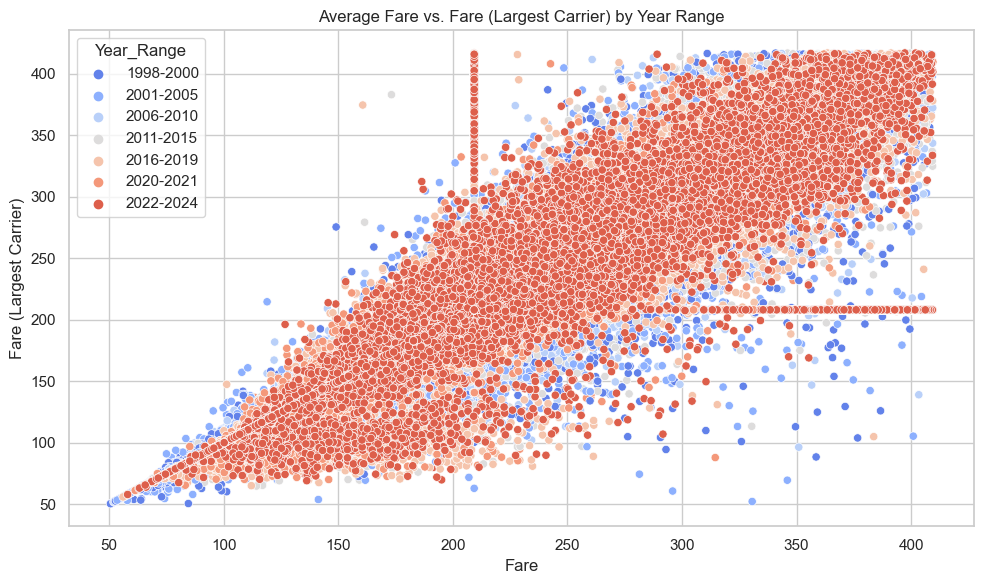

In [78]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=airline, x='fare', y='fare_lg', hue='Year_Range', palette='coolwarm', marker='o')
plt.title('Average Fare vs. Fare (Largest Carrier) by Year Range')
plt.xlabel('Fare')
plt.ylabel('Fare (Largest Carrier)')
plt.grid(True)
plt.tight_layout()
plt.show()

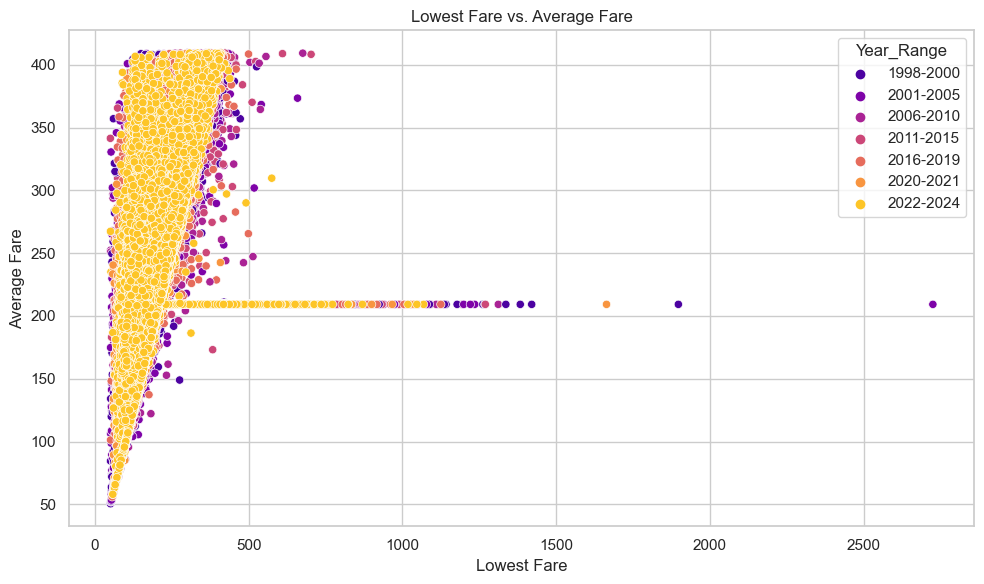

In [75]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=airline, x='fare_low', y='fare', hue='Year_Range', palette='plasma', marker='o')
plt.title('Lowest Fare vs. Average Fare')
plt.xlabel('Lowest Fare')
plt.ylabel('Average Fare')
plt.grid(True)
plt.tight_layout()
plt.show()


### Hypothesis Testing

#### One Sample t-Test

In [65]:
from scipy import stats
from scipy.stats import ttest_1samp

# Null Hypothesis = The mean fare is $220
HM = 220
alpha = 0.05

# one-sample t-test
t_statistic, p_value = ttest_1samp(airline['fare'],HM)

print(f"T-Statistic: {t_statistic}")
print(f"P-Value: {p_value}")
if p_value <alpha:
    print(f"Reject the null hypothesis at alpha = {alpha}")
else:
    print(f"Fail to reject the null hypothesis at alpha = {alpha}")

T-Statistic: -49.29136391714037
P-Value: 0.0
Reject the null hypothesis at alpha = 0.05


#### One Way Anova

In [66]:

f_statistics, p_value = stats.f_oneway(airline['passengers'][airline['Year_Range'] == '2001-2005'],
                                       airline['passengers'][airline['Year_Range'] == '2006-2010'],
                                       airline['passengers'][airline['Year_Range'] == '2011-2015'])

alpha = 0.05
print("F-Statistics:", f_statistics)
print("p-Value:", p_value)
print("************")

if p_value < alpha:
    print(f"Reject the null hypothesis at alpha = {alpha}.")
    print("There is a statistically significant difference in the average number of passengers across the year ranges.")
else:
    print(f"Fail to reject the null hypothesis at alpha = {alpha}.")
    print("There is no statistically significant difference in the average number of passengers across the year ranges.")


F-Statistics: 103.44210239080775
p-Value: 1.2977367286641821e-45
************
Reject the null hypothesis at alpha = 0.05.
There is a statistically significant difference in the average number of passengers across the year ranges.


#### CHI Square Test

In [67]:
from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(airline['Year_Range'], airline['city_pair'])

chi2_result = chi2_contingency(contingency_table, correction = False)
print("Chi-Square test result:", chi2_result)


Chi-Square test result: Chi2ContingencyResult(statistic=33484.225849688504, pvalue=0.0, dof=6762, expected_freq=array([[24.2679538 ,  0.36041516, 45.89286312, ..., 10.09162435,
        38.32414486,  2.52290609],
       [39.79377081,  0.5909966 , 75.25356658, ..., 16.54790469,
        62.84263806,  4.13697617],
       [37.9508491 ,  0.56362647, 71.7684374 , ..., 15.78154121,
        59.93228149,  3.9453853 ],
       ...,
       [30.77265964,  0.4570197 , 58.19384149, ..., 12.79655153,
        48.59642784,  3.19913788],
       [14.34228931,  0.2130043 , 27.1225471 , ...,  5.96412031,
        22.64945688,  1.49103008],
       [16.40782694,  0.2436806 , 31.02866284, ...,  6.82305675,
        25.91137027,  1.70576419]]))


In [68]:
alpha=0.05
pvalue = 0.00
if pvalue <alpha:
    print(f"Reject the null hypothesis at alpha = {alpha}.")
    print("There is a statistically significant association between Year_Range and city_pair in your data.")
else:
    print(f"Fail to reject the null hypothesis at alpha = {alpha}.")


Reject the null hypothesis at alpha = 0.05.
There is a statistically significant association between Year_Range and city_pair in your data.
